In [220]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [221]:
import numpy as np
X_train = np.load('X_train.npy')
X_test = np.load('X_test.npy')
y_train = np.load('y_train.npy') 
y_test = np.load('y_test.npy')
print(X_train.shape)
print(X_test.shape)

(59, 2)
(59, 2)


In [468]:
from keras.models import Sequential
from keras import optimizers
from keras.layers.core import Dense, Activation, Dropout
from helper import PlotLosses
from keras.callbacks import ModelCheckpoint
from keras.initializers import RandomNormal
from helper import plot_boundaries, plot_boundaries_for_video
from matplotlib import pyplot as plt
from keras import regularizers
from keras.constraints import max_norm

In [486]:
# Paramtros fijos
input_shape = 2 # Tenemos solo 2 features
output_size = 1 # Solo tenemos 2 clases

# Parametros a modificar
hidden_units = 20 # Tratar de encontrar un tamaño optimo para el test set

# Probar distintos initializers
# kernel_initializer = 'zeros'
kernel_initializer = RandomNormal(mean=0.0, stddev=0.1, seed=None)

In [507]:
lambda_reg = 0.000 # 0.0001
dropout_rate = 0.2
max_norm_cons = 10.0
model = Sequential()
# model.add(Dropout(dropout_rate, input_shape=(input_shape,)))
model.add(Dense(hidden_units,input_dim=input_shape, kernel_regularizer=regularizers.l2(lambda_reg), kernel_constraint=max_norm(max_norm_cons)))
model.add(Activation('sigmoid'))
model.add(Dropout(dropout_rate))
model.add(Dense(output_size, kernel_initializer=kernel_initializer, kernel_regularizer=regularizers.l2(lambda_reg)))
model.add(Activation('sigmoid'))
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_139 (Dense)            (None, 20)                60        
_________________________________________________________________
activation_137 (Activation)  (None, 20)                0         
_________________________________________________________________
dropout_29 (Dropout)         (None, 20)                0         
_________________________________________________________________
dense_140 (Dense)            (None, 1)                 21        
_________________________________________________________________
activation_138 (Activation)  (None, 1)                 0         
Total params: 81
Trainable params: 81
Non-trainable params: 0
_________________________________________________________________


In [508]:
# Para SGD lr=2 funciona ok pero muy lento: 40.000 epochs acc 1 (decay = 0) (20 hidden units)
# Para adam 0.4, decay = 0.002 converge enseguida (20 hidden units)
# Correrlo mas de una vez con los mismos parametros y verificar los resultados
lr = 0.2 # Modificarlo y ver que ocurre.
decay = 0.002 # Modificarlo y ver que ocurre
batch_size = 59 # 59 es el tamaño del train set. Seria hacer GD, en 1 seria SGD. Probar valores intermedios tambien
epochs = 4000

# Elejir uno de estos dos optimizadores. O buscar documentación y probar algun otro
# selectedOptimizer = optimizers.SGD(lr=lr, decay=decay)
selectedOptimizer = optimizers.adam(lr=lr, decay=decay)

# Lo compilo
model.compile(loss = 'binary_crossentropy', optimizer=selectedOptimizer, metrics=['accuracy'])

In [509]:
# Se puede tocar plot_interval para acelerar el proceso, el resto recomendamos no tocarlo
plot_losses = PlotLosses(plot_interval=100, 
                         evaluate_interval=None, 
                         x_val=X_test, 
                         y_val_categorical=y_test)

In [510]:
import shutil
import os
directory = './checkpoints/'

if os.path.exists(directory):
    shutil.rmtree(directory)
checkpointer = ModelCheckpoint(filepath='./checkpoints/weights.{epoch:04d}-{acc:.2f}.hdf5', period=1)
if not os.path.exists(directory):
    os.makedirs(directory)

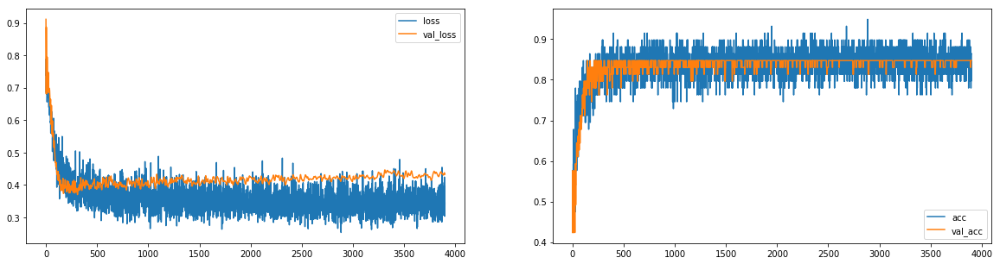

In [511]:
model.fit(X_train, 
          y_train, batch_size = batch_size,
          epochs=epochs, 
          verbose=0, 
          validation_data=(X_test, y_test), 
          callbacks=[plot_losses, checkpointer],
         )

In [512]:
import glob
files = []
for filename in glob.glob('./checkpoints/*.hdf5'):
    files.append(filename)
files = np.sort(files)
N = files.shape[0]

In [513]:
from helper import gen_log_space

In [514]:
gen_log_space(N, 100)

array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
         11,   12,   13,   14,   15,   16,   17,   19,   20,   21,   23,
         24,   26,   28,   30,   32,   34,   37,   39,   42,   45,   48,
         51,   55,   59,   63,   67,   72,   77,   82,   87,   93,  100,
        107,  114,  122,  130,  139,  149,  159,  170,  181,  194,  207,
        221,  236,  252,  269,  288,  307,  328,  351,  374,  400,  427,
        456,  487,  521,  556,  594,  634,  677,  723,  773,  825,  881,
        941, 1005, 1074, 1147, 1225, 1308, 1397, 1492, 1593, 1701, 1817,
       1940, 2072, 2213, 2363, 2524, 2696, 2879, 3074, 3283, 3506, 3745,
       3999], dtype=uint64)

Para hacer el video:  
ffmpeg -r 1 -i images/%4d.png -pix_fmt yuv420p -r 10 output.mp4

In [515]:
directory = './images/'

if os.path.exists(directory):
    shutil.rmtree(directory)
checkpointer = ModelCheckpoint(filepath='./checkpoints/weights.{epoch:04d}-{acc:.2f}.hdf5', period=1)
if not os.path.exists(directory):
    os.makedirs(directory)

59/59 [==============================] - 0s 100us/step
1 0.5593220460212837 0.423728808508081


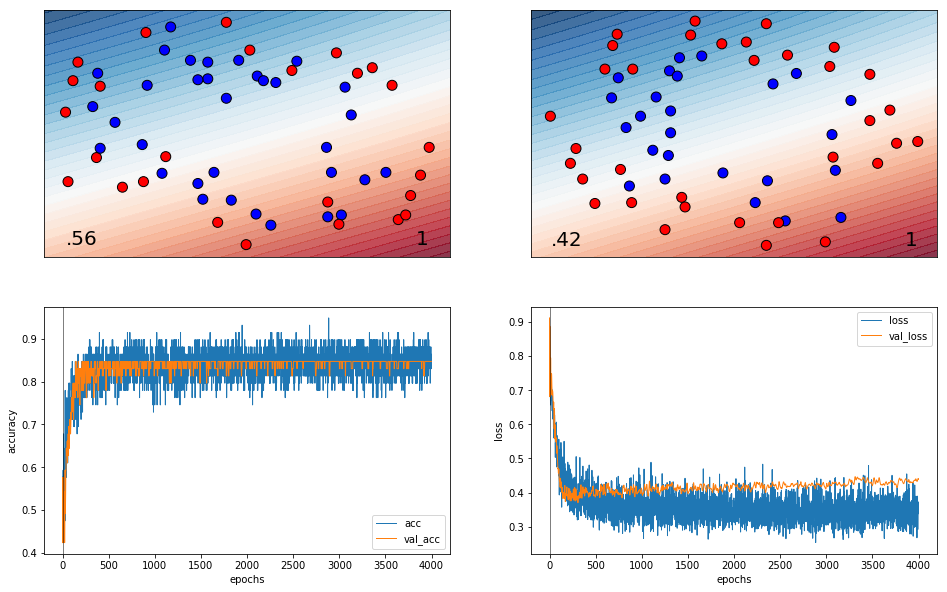

59/59 [==============================] - 0s 105us/step
2 0.44067796761706723 0.5762711914919191


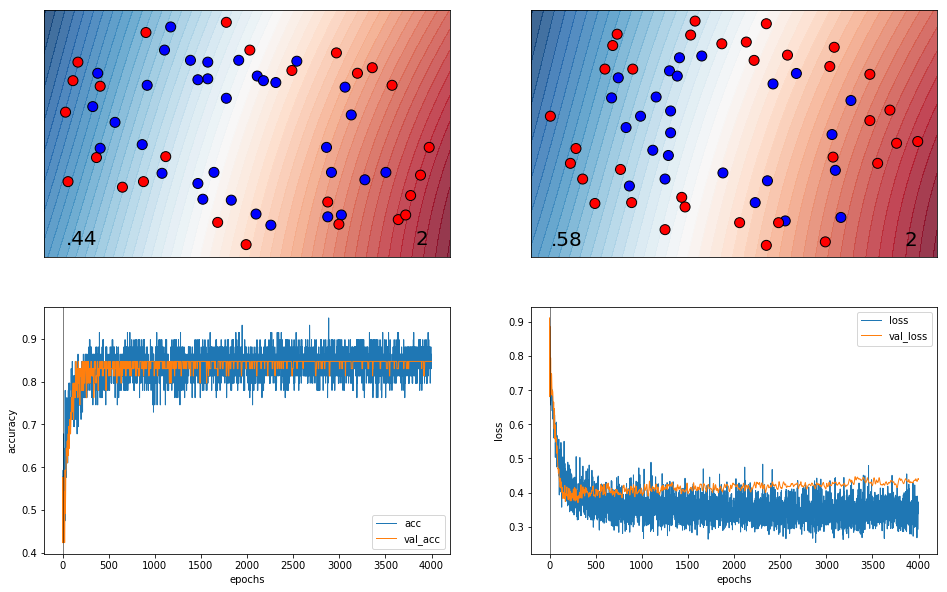

59/59 [==============================] - 0s 116us/step
3 0.4237288115388256 0.5762711914919191


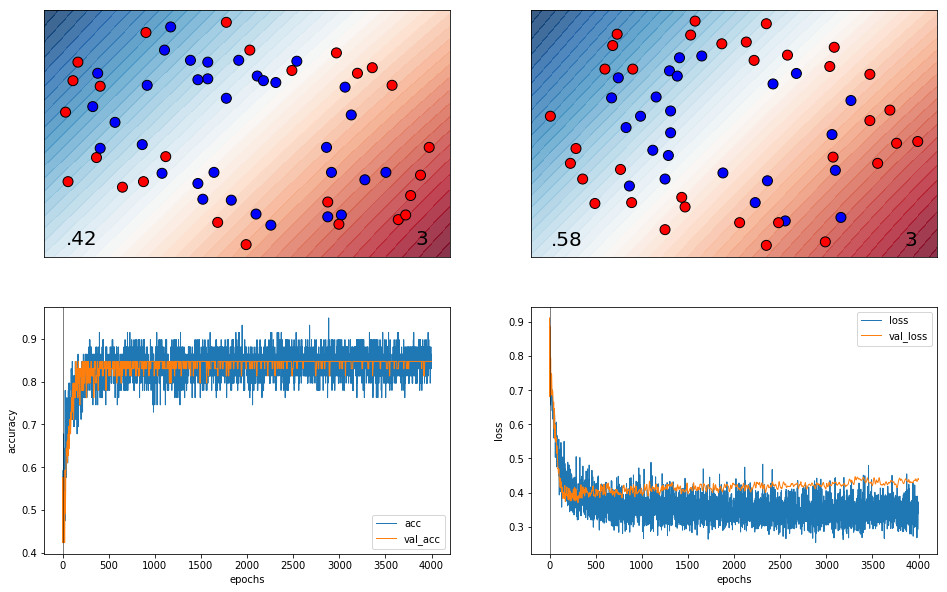

59/59 [==============================] - 0s 146us/step
4 0.5593220460212837 0.423728808508081


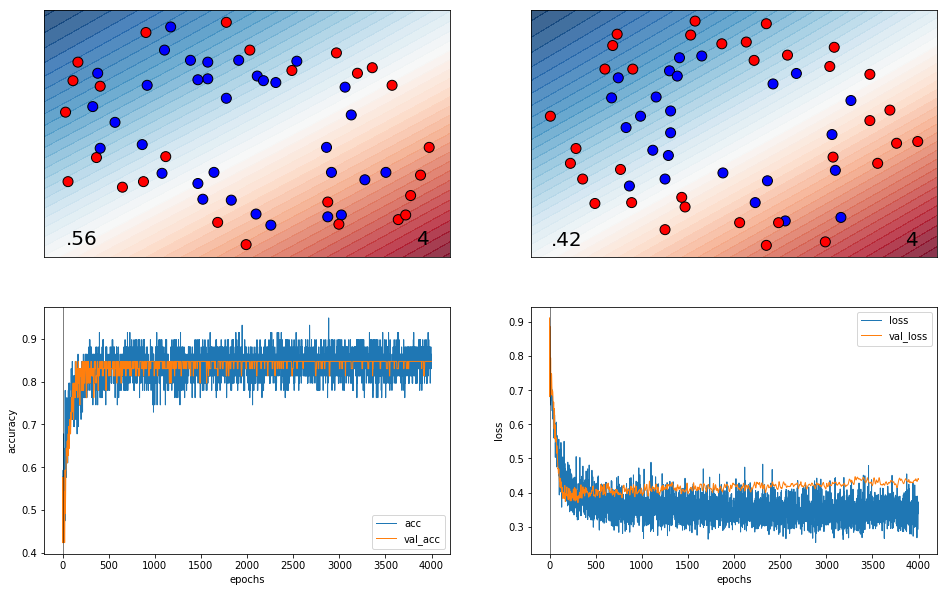

59/59 [==============================] - 0s 105us/step
5 0.5593220460212837 0.423728808508081


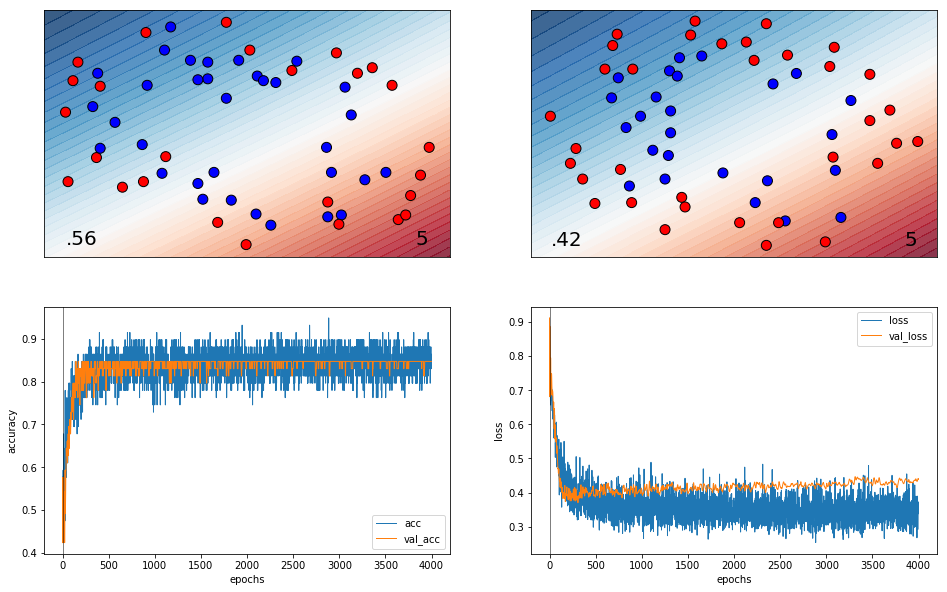

59/59 [==============================] - 0s 96us/step
6 0.5593220460212837 0.423728808508081


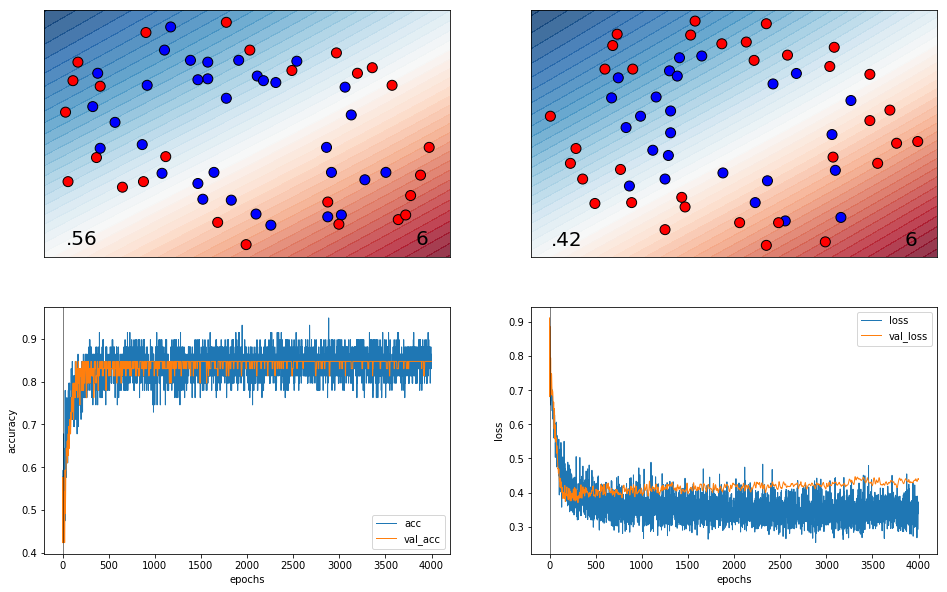

59/59 [==============================] - 0s 119us/step
7 0.559322042990539 0.5254237308340558


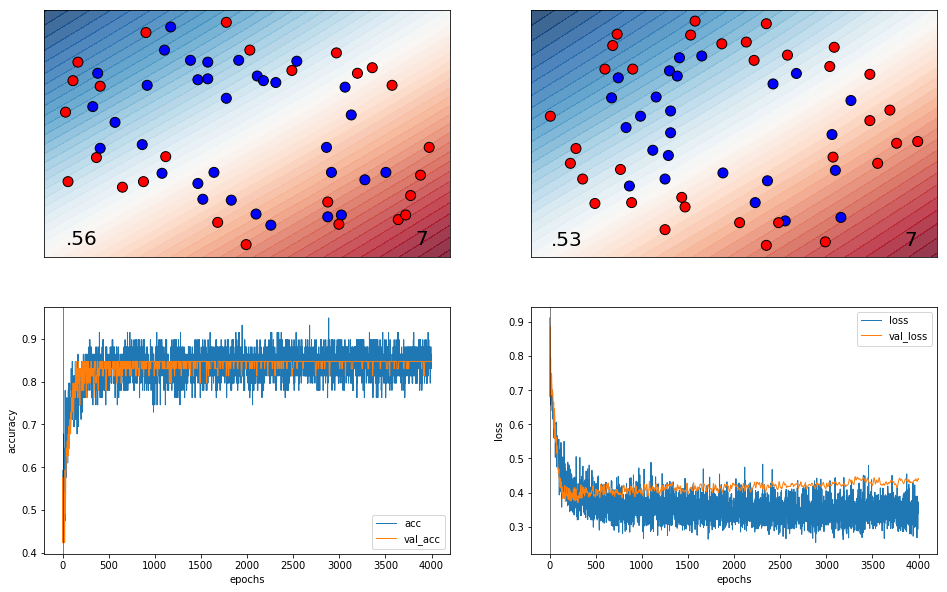

59/59 [==============================] - 0s 571us/step
8 0.38983050645407985 0.5254237303289316


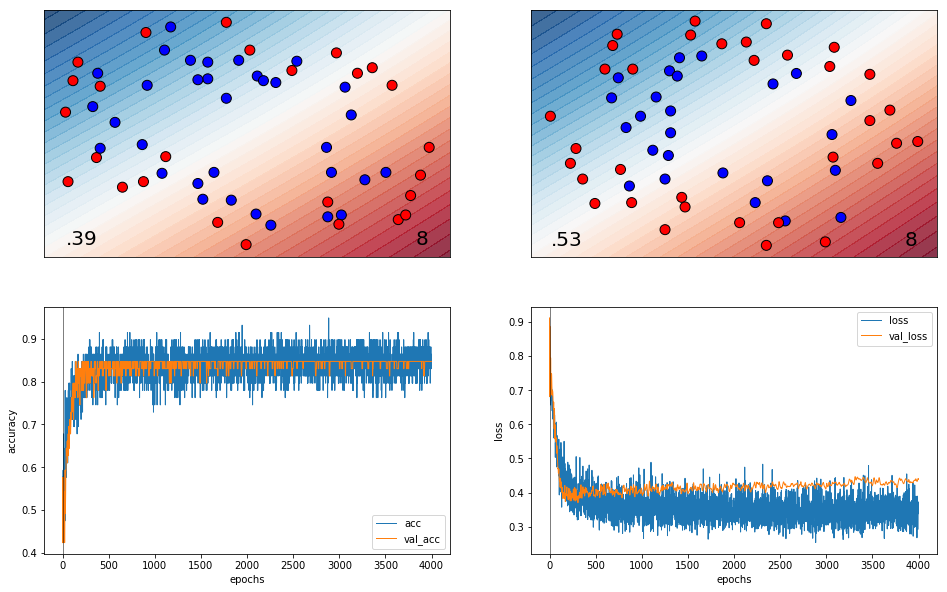

59/59 [==============================] - 0s 119us/step
9 0.44067796761706723 0.5762711914919191


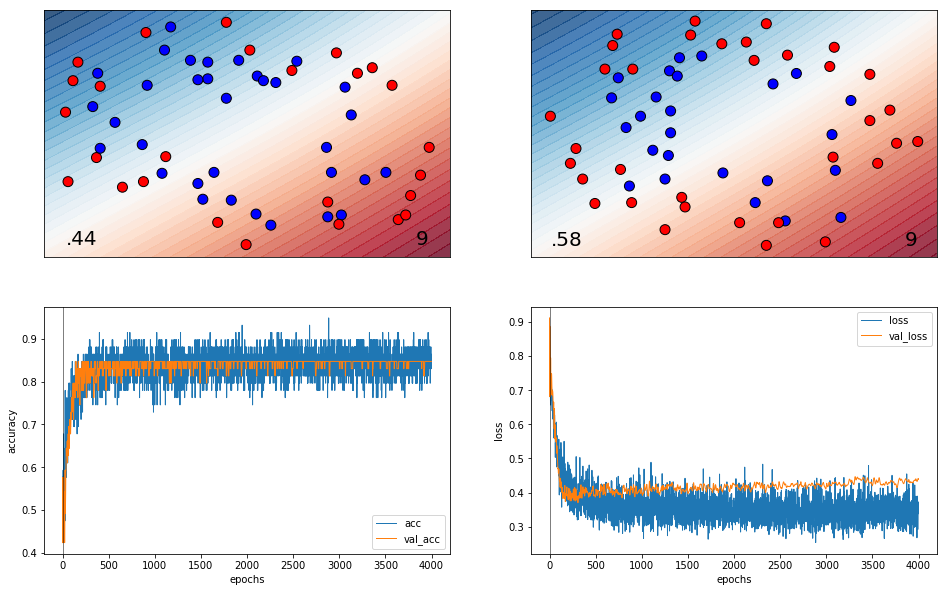

59/59 [==============================] - 0s 128us/step
10 0.5254237308340558 0.508474588394165


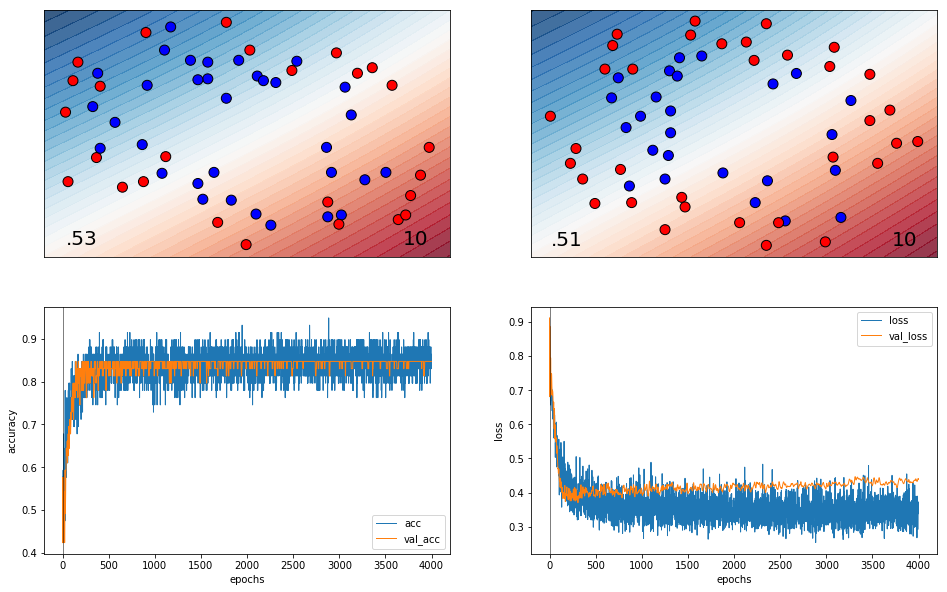

59/59 [==============================] - 0s 112us/step
11 0.610169483443438 0.4237288186105631


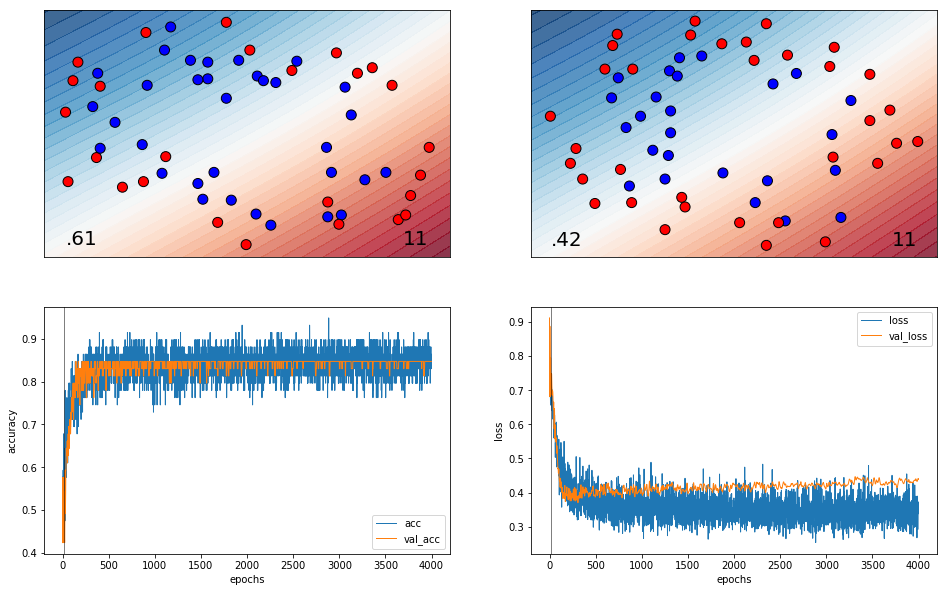

59/59 [==============================] - 0s 113us/step
12 0.5593220460212837 0.423728808508081


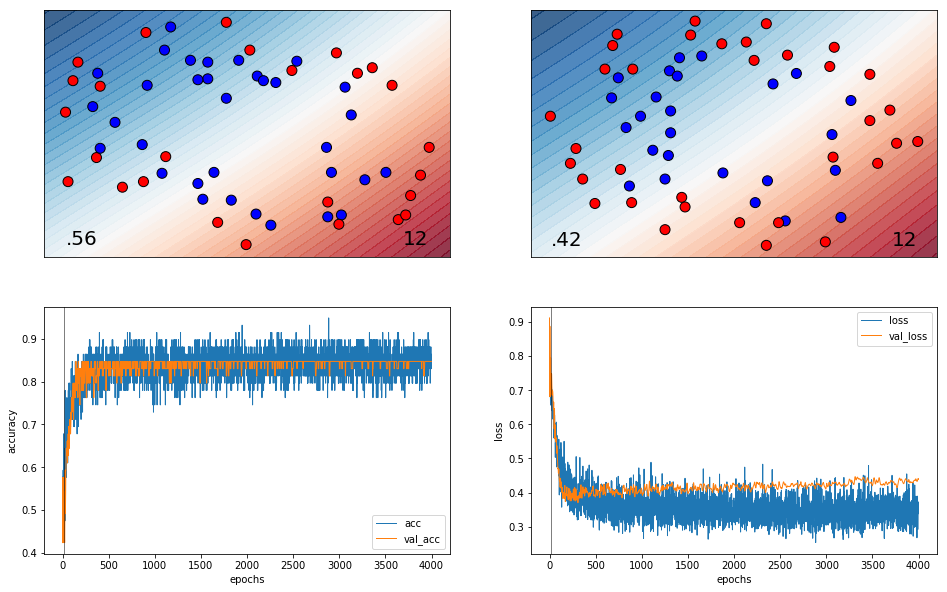

59/59 [==============================] - 0s 334us/step
13 0.5593220460212837 0.423728808508081


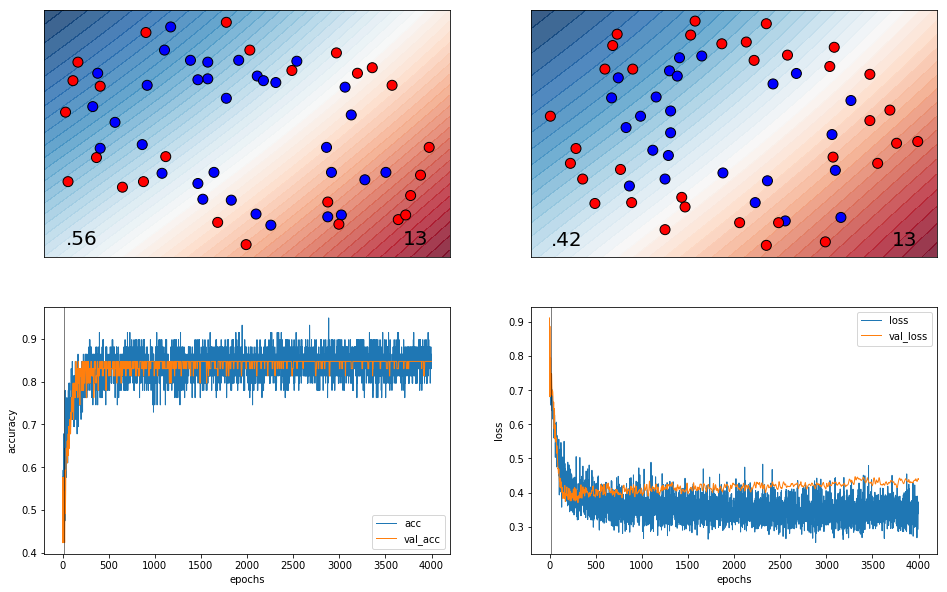

59/59 [==============================] - 0s 139us/step
14 0.5593220460212837 0.423728808508081


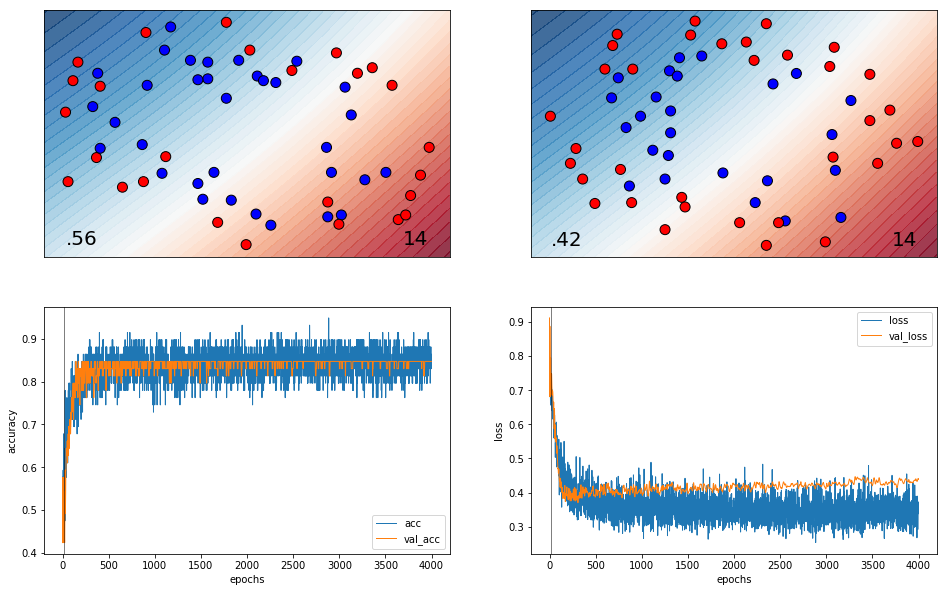

59/59 [==============================] - 0s 123us/step
15 0.5593220460212837 0.423728808508081


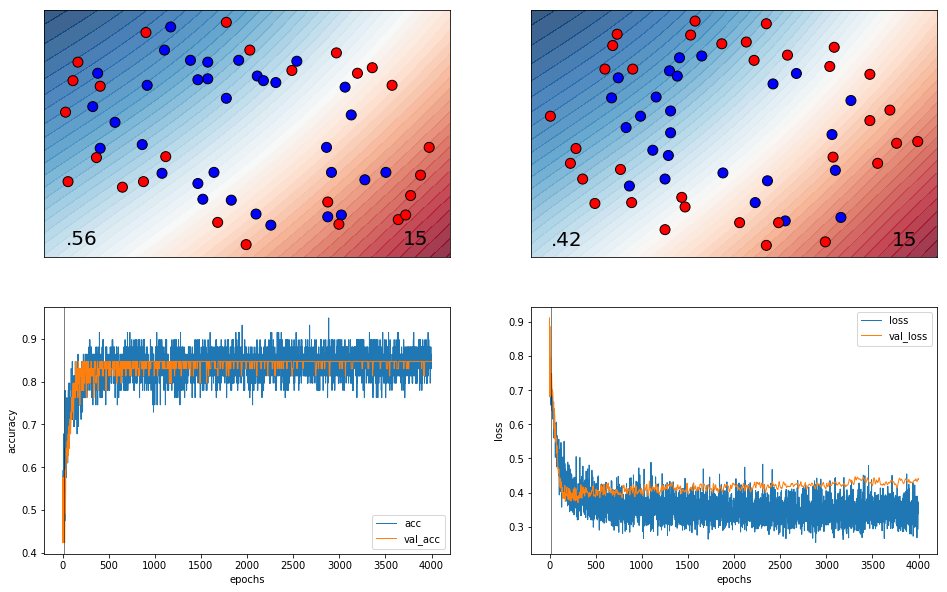

59/59 [==============================] - 0s 119us/step
16 0.5932203309010651 0.474576272701813


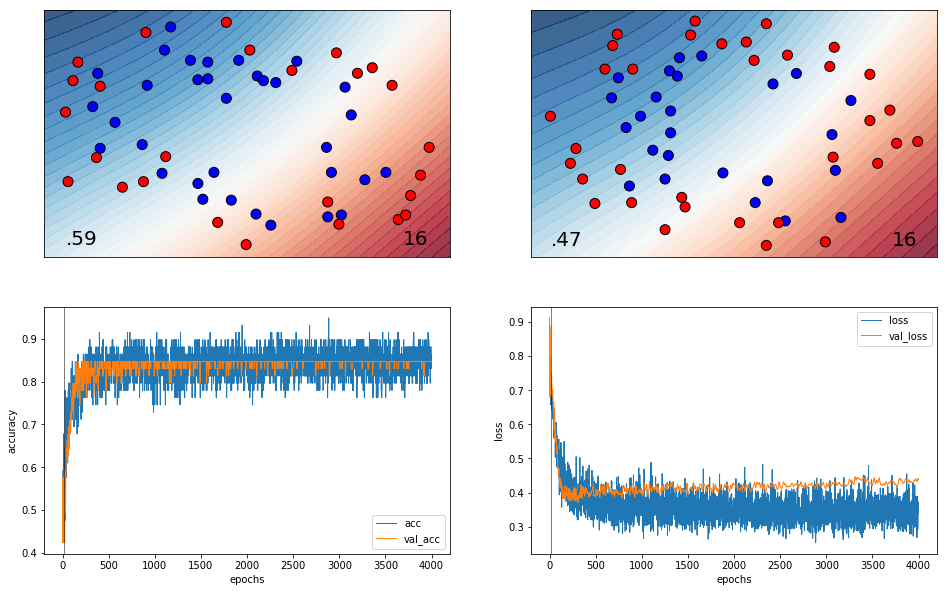

59/59 [==============================] - 0s 421us/step
17 0.559322042990539 0.5423728833764286


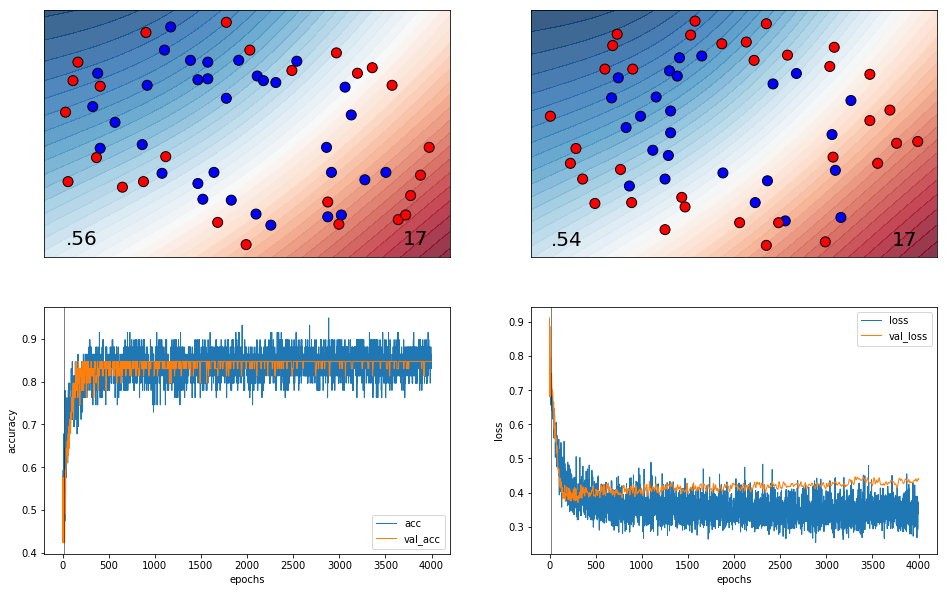

59/59 [==============================] - 0s 146us/step
18 0.5593220258163194 0.5254237237623183


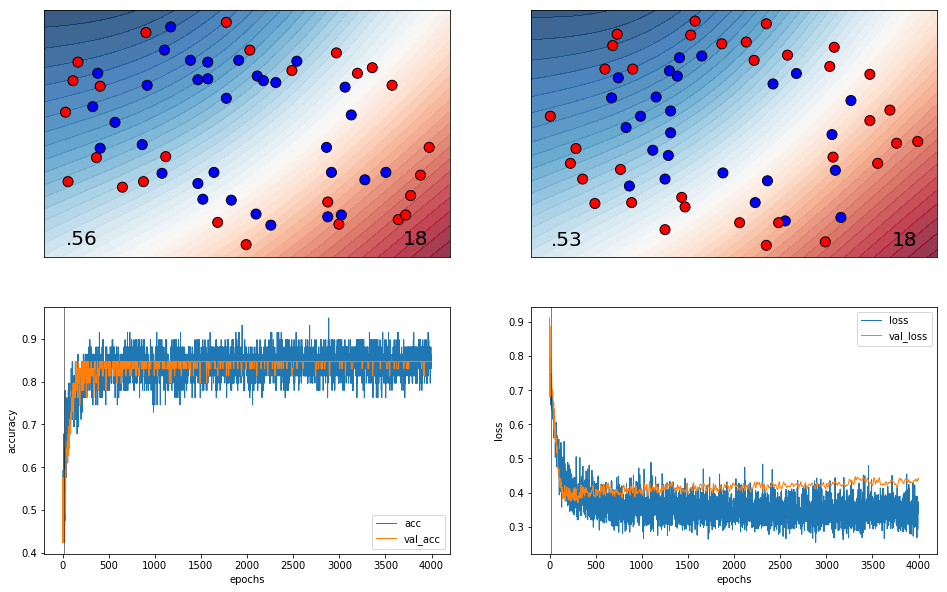

59/59 [==============================] - 0s 135us/step
20 0.5762711854304298 0.5084745782916829


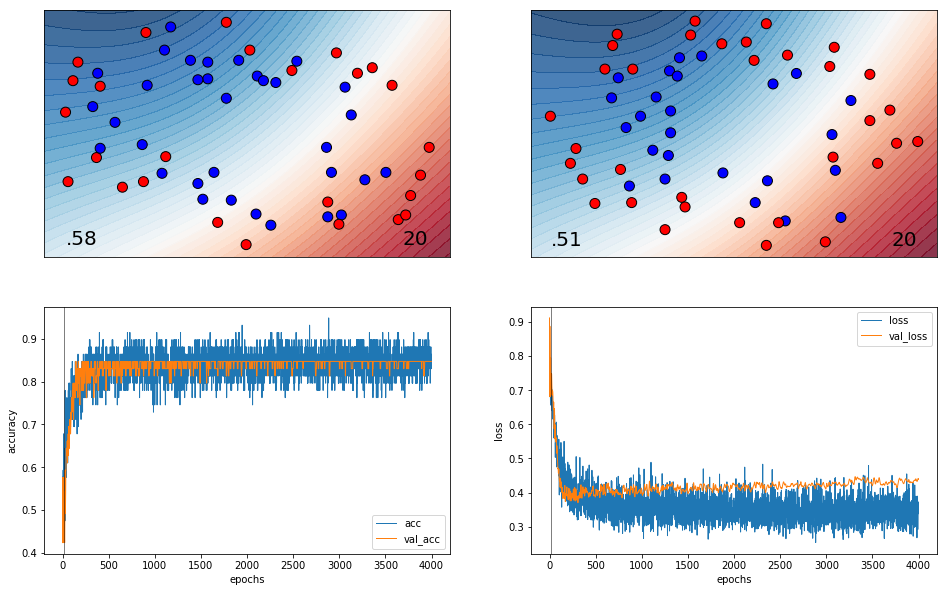

59/59 [==============================] - 0s 130us/step
21 0.6101695006176576 0.4915254186775725


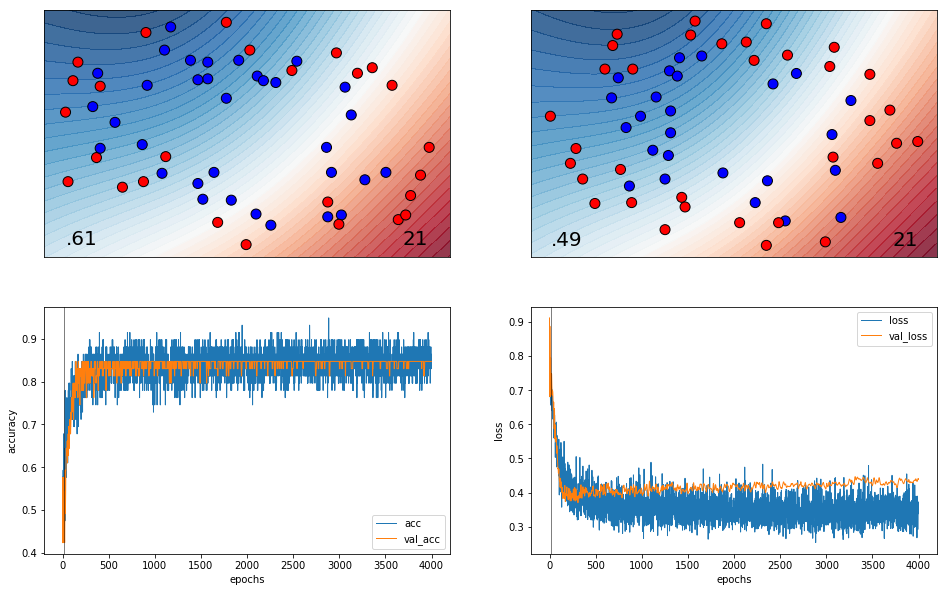

59/59 [==============================] - 0s 218us/step
22 0.5932203410035473 0.423728808508081


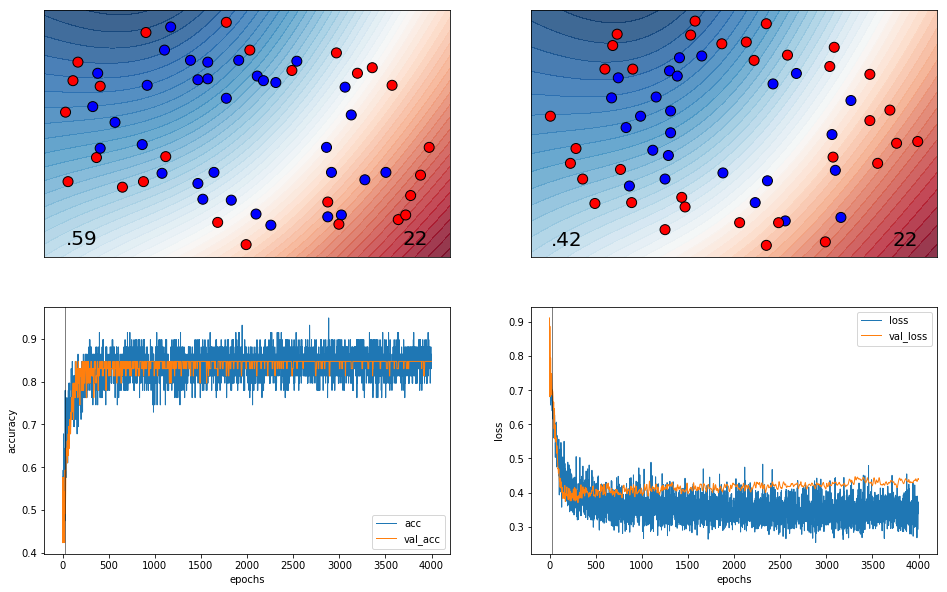

59/59 [==============================] - 0s 108us/step
24 0.5593220460212837 0.423728808508081


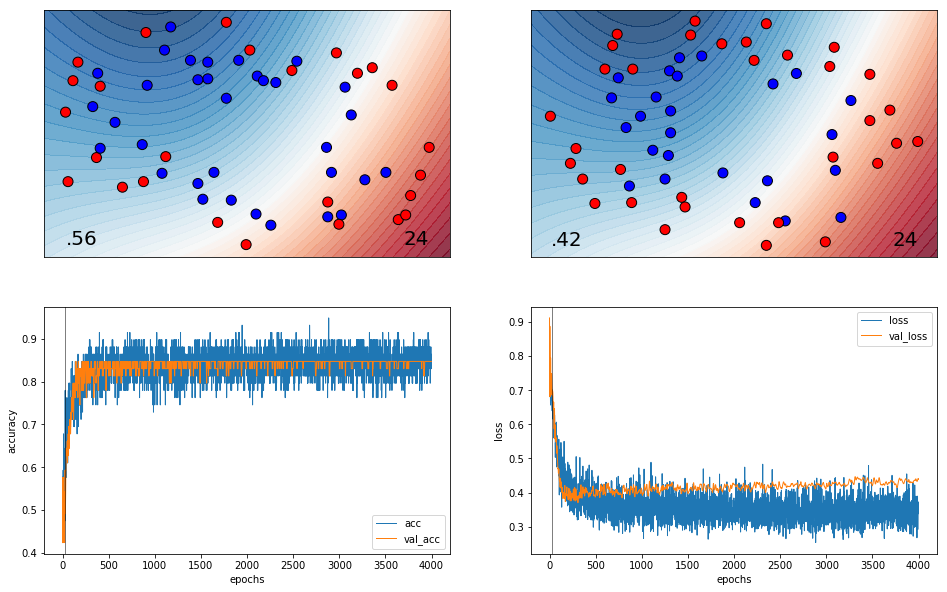

59/59 [==============================] - 0s 123us/step
25 0.5932203410035473 0.423728808508081


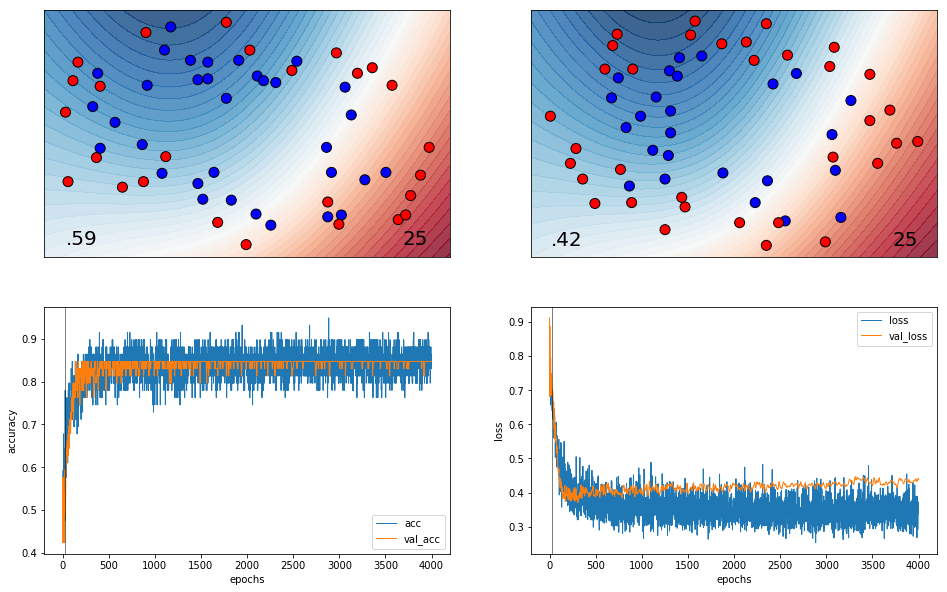

59/59 [==============================] - 0s 105us/step
27 0.6101695006176576 0.508474588394165


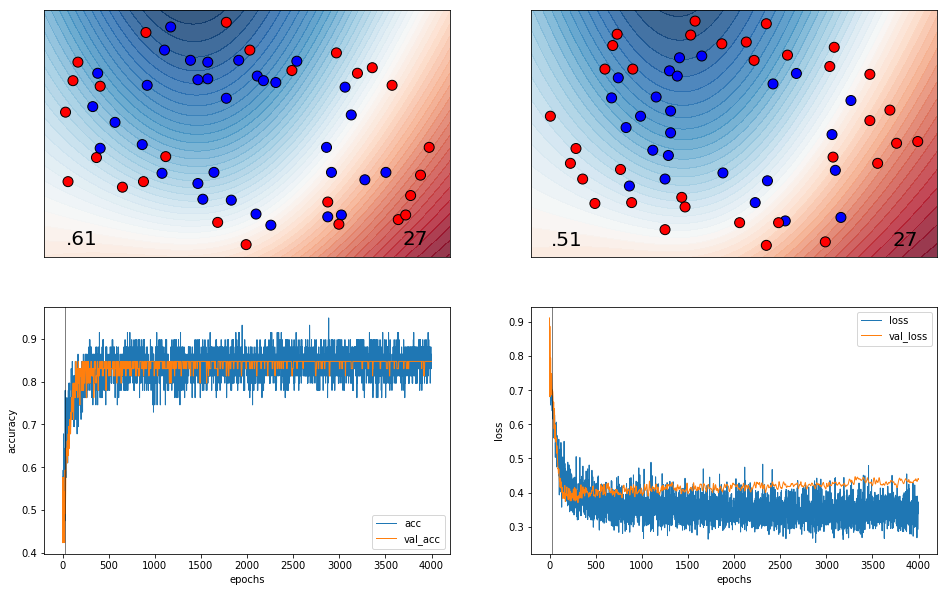

59/59 [==============================] - 0s 103us/step
29 0.6271186329550662 0.5932203278703204


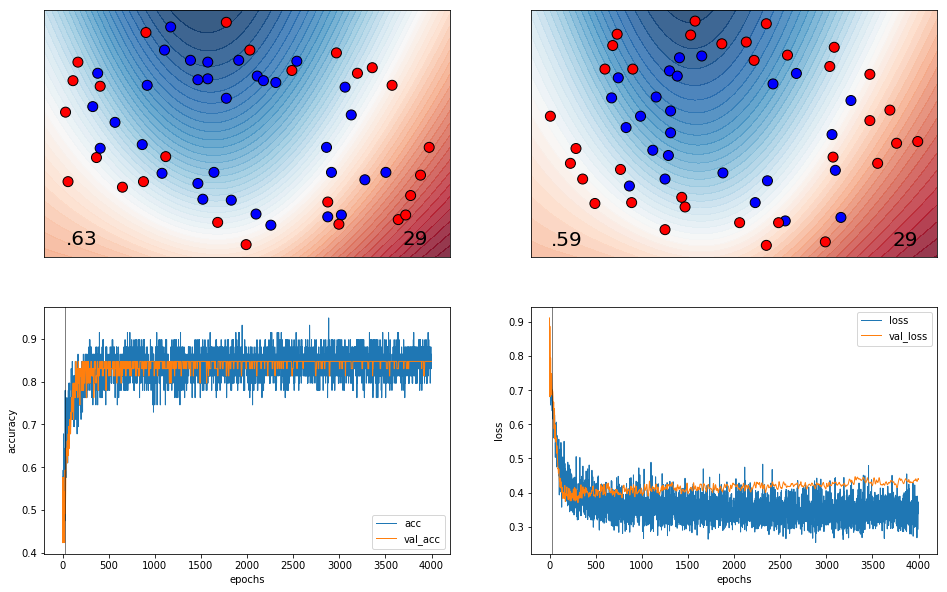

59/59 [==============================] - 0s 93us/step
31 0.6271186430575484 0.5254237308340558


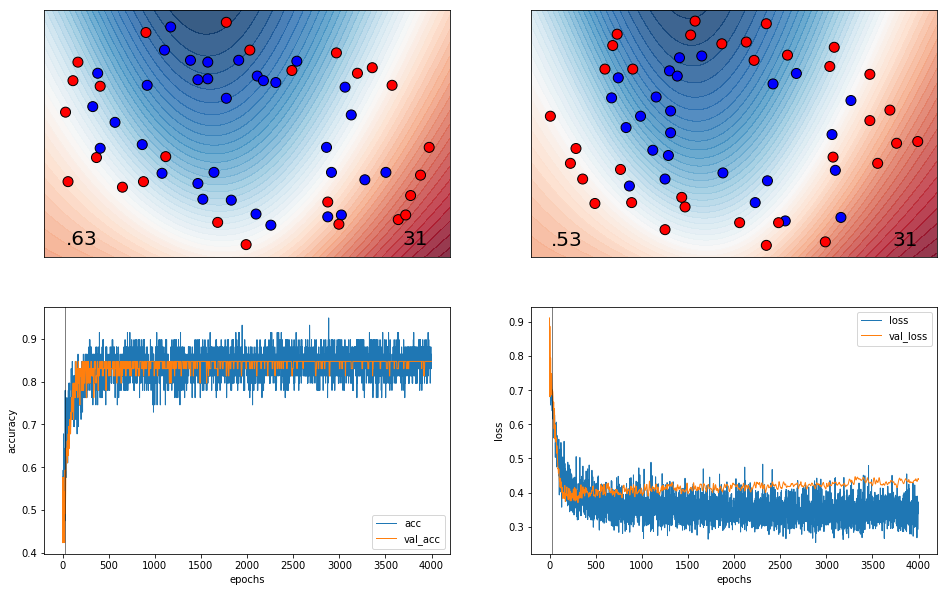

59/59 [==============================] - 0s 129us/step
33 0.6101695006176576 0.5084745782916829


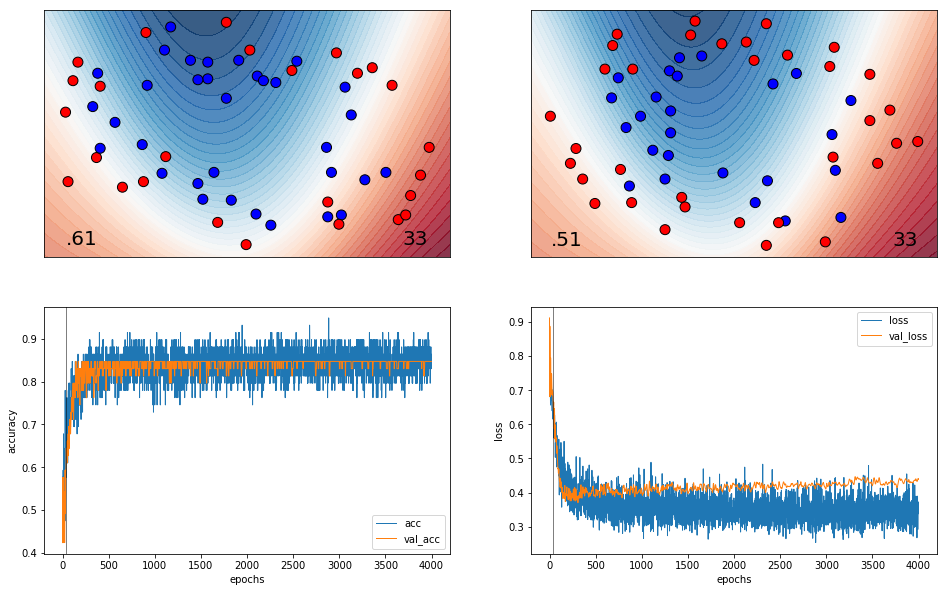

59/59 [==============================] - 0s 110us/step
35 0.6271186531600306 0.5423728732739465


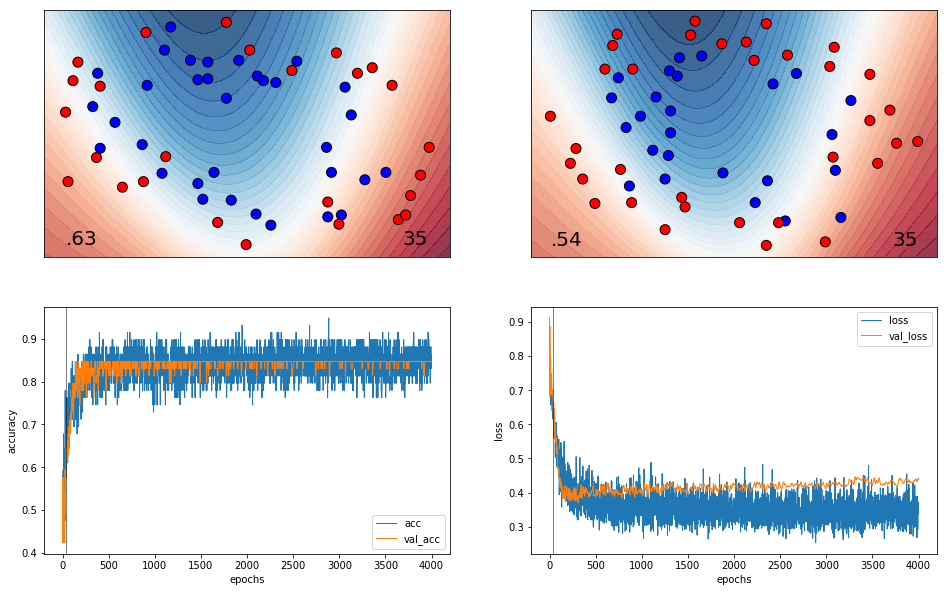

59/59 [==============================] - 0s 113us/step
38 0.677966100684667 0.5932203379728026


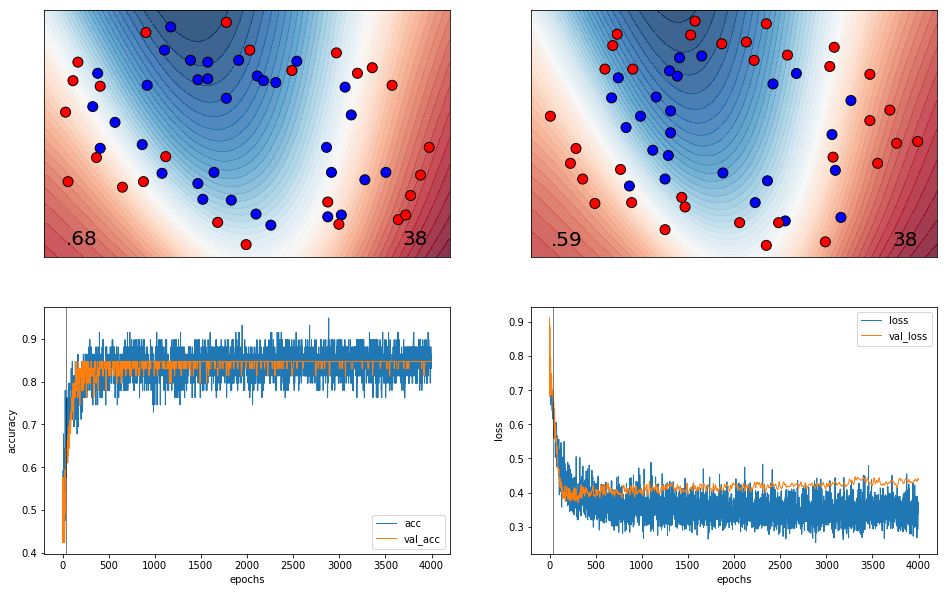

59/59 [==============================] - 0s 133us/step
40 0.69491525322704 0.6440677955999212


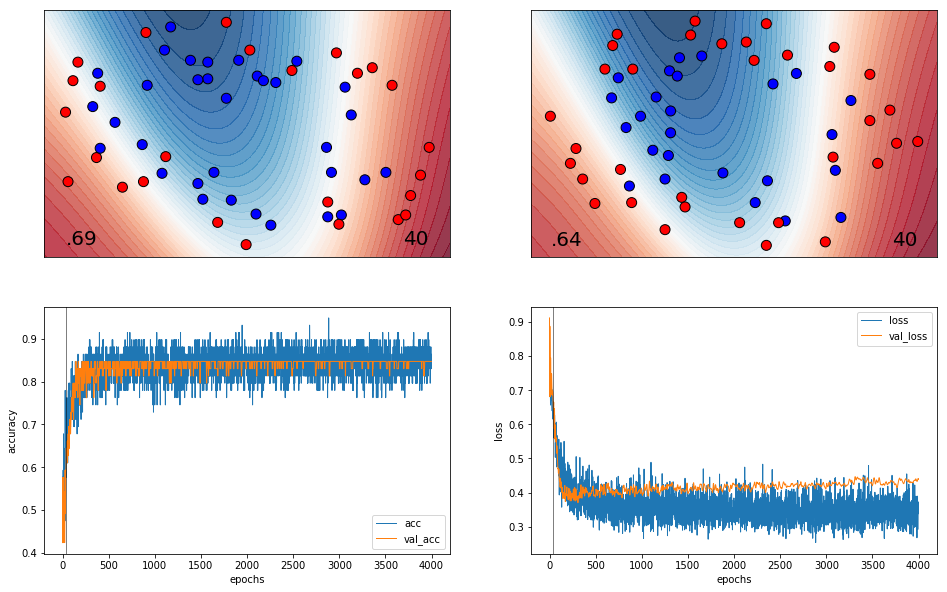

59/59 [==============================] - 0s 106us/step
43 0.7288135583117857 0.6440677955999212


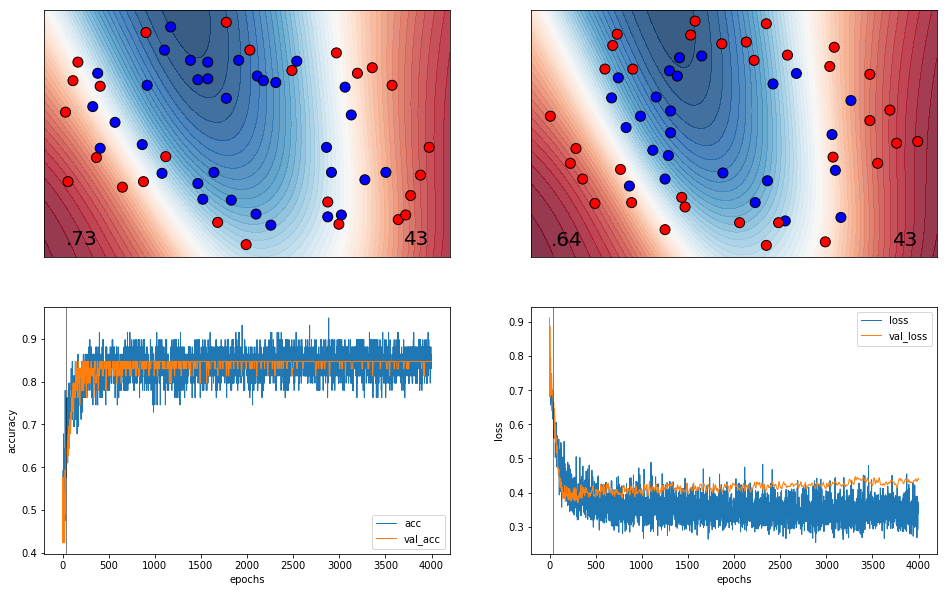

59/59 [==============================] - 0s 103us/step
46 0.7457627007516764 0.6440677955999212


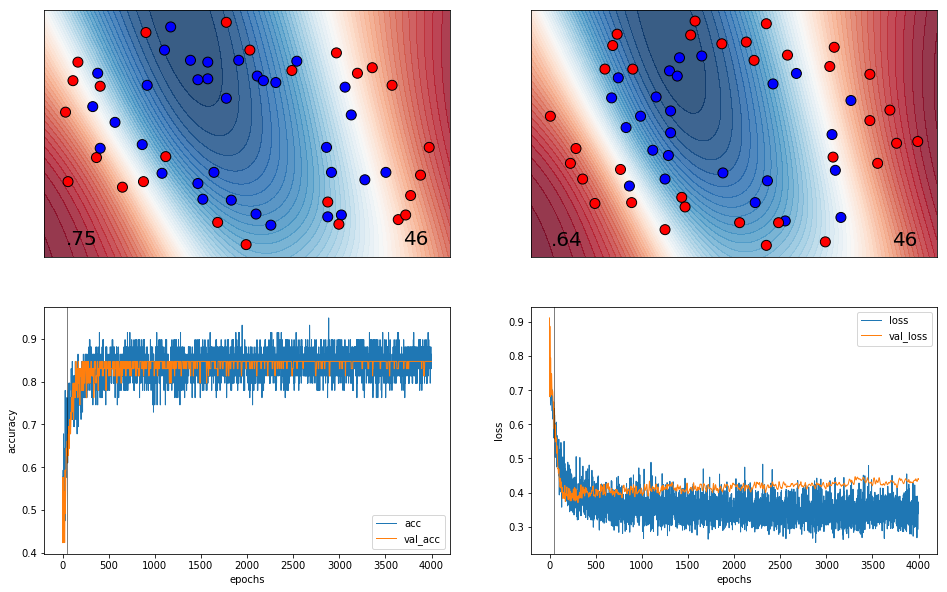

59/59 [==============================] - 0s 141us/step
49 0.7118643986976753 0.6440677854974391


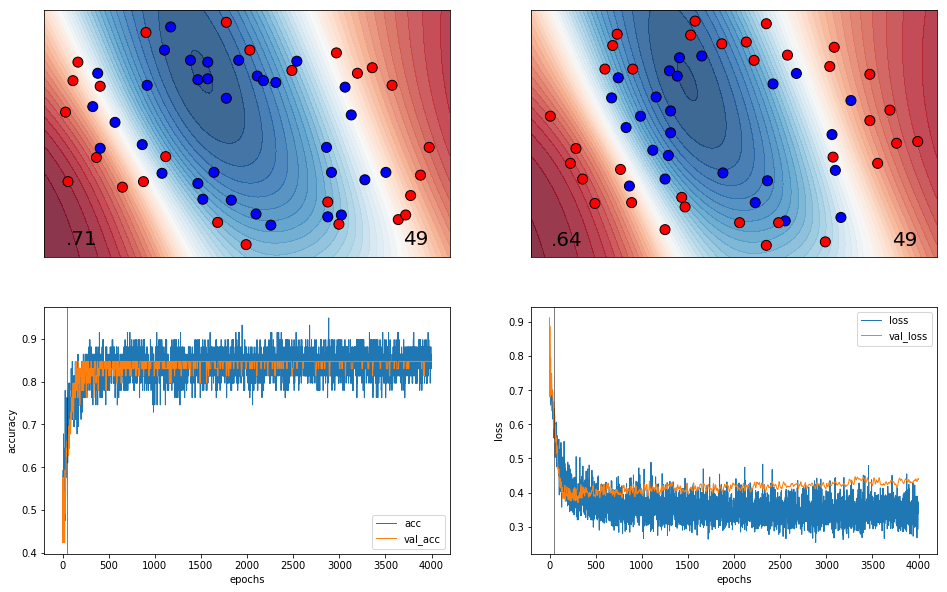

59/59 [==============================] - 0s 121us/step
52 0.7118643986976753 0.661016938039812


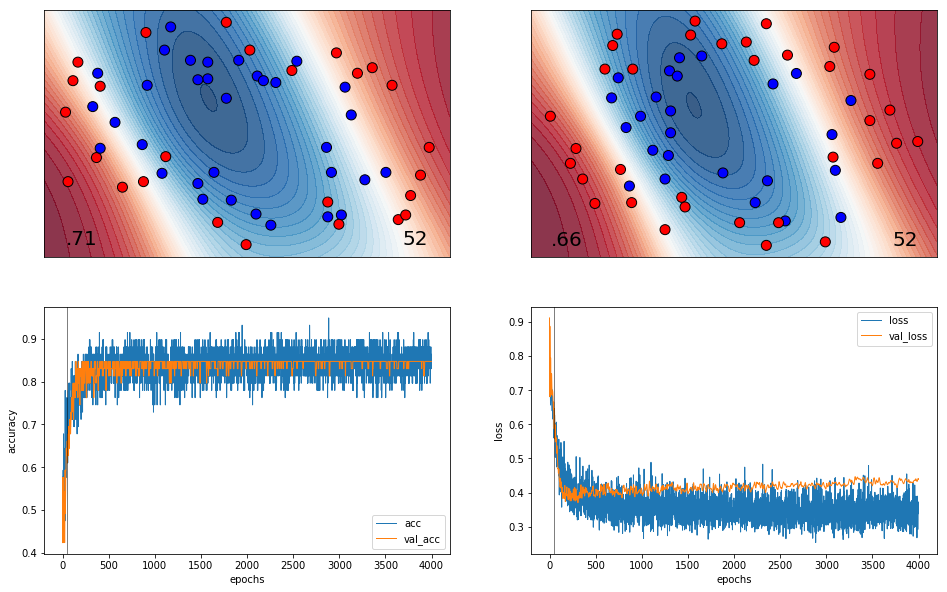

59/59 [==============================] - 0s 109us/step
56 0.7118644057694128 0.6271186430575484


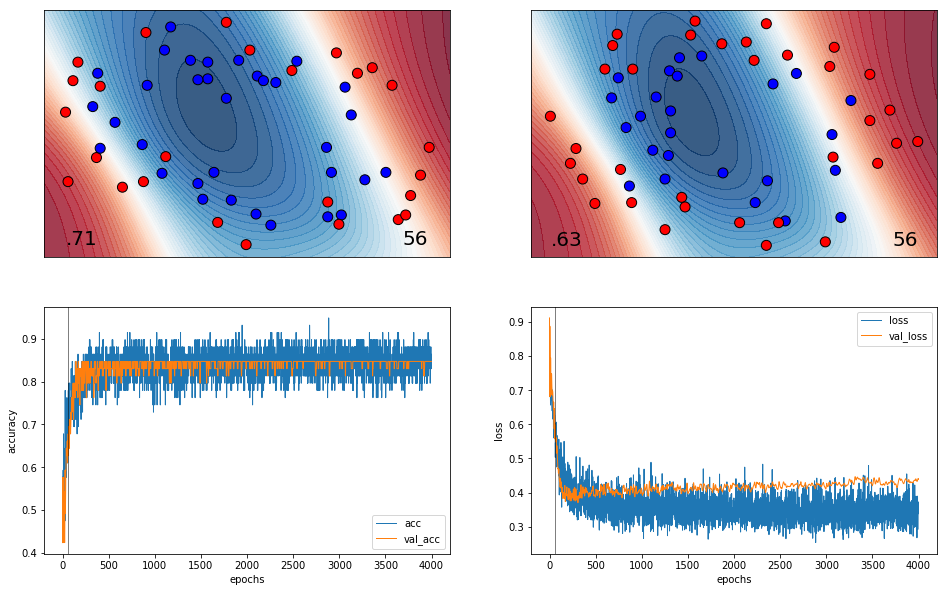

59/59 [==============================] - 0s 97us/step
60 0.7118643986976753 0.6610169481422942


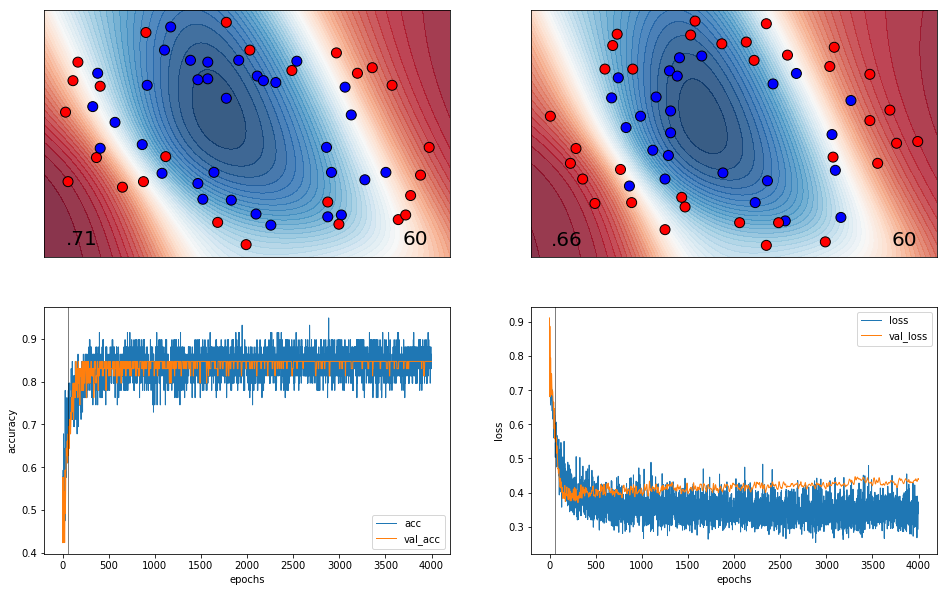

59/59 [==============================] - 0s 115us/step
64 0.7288135583117857 0.6271186430575484


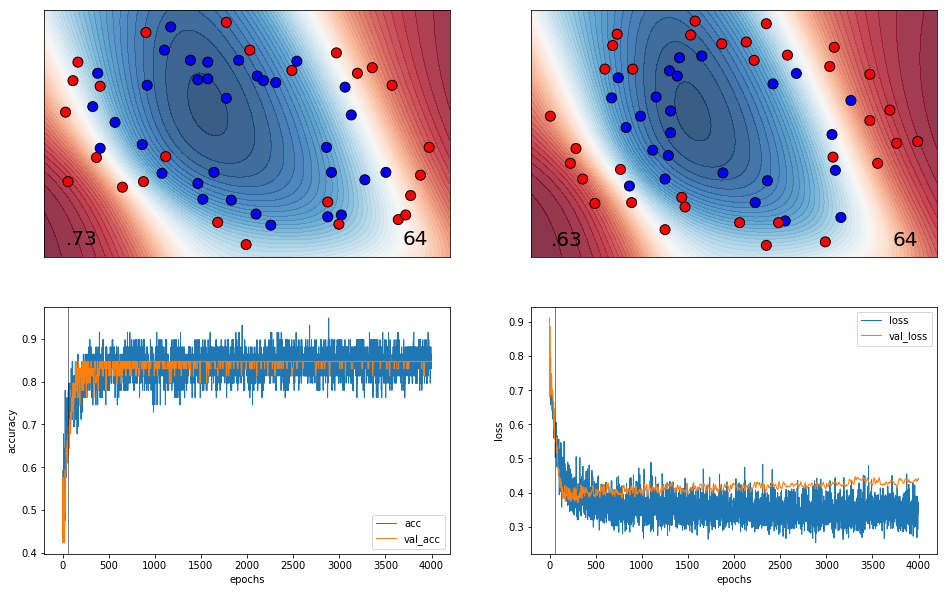

59/59 [==============================] - 0s 110us/step
68 0.7627118704682689 0.677966100684667


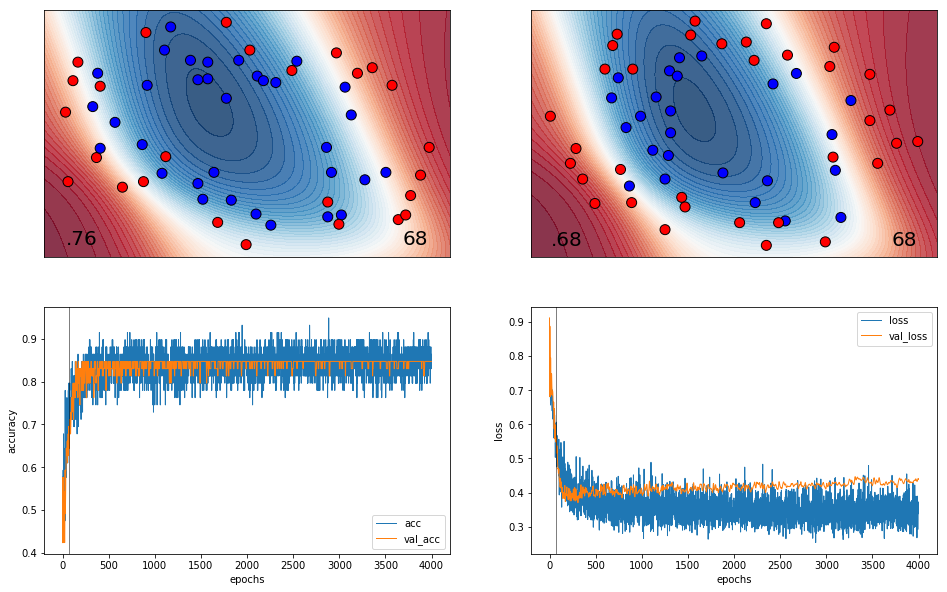

59/59 [==============================] - 0s 107us/step
73 0.7627118704682689 0.6610169481422942


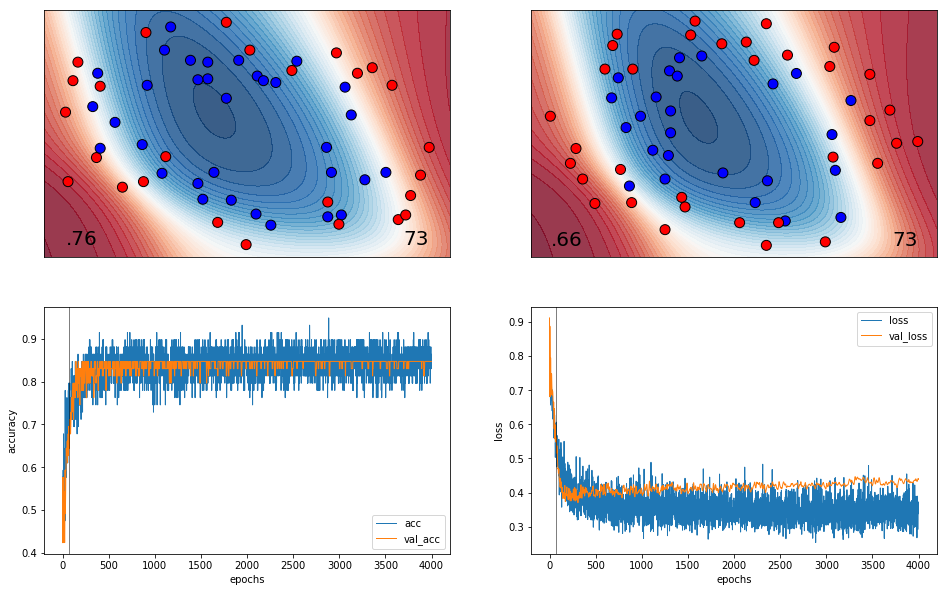

59/59 [==============================] - 0s 130us/step
78 0.7627118532940492 0.677966100684667


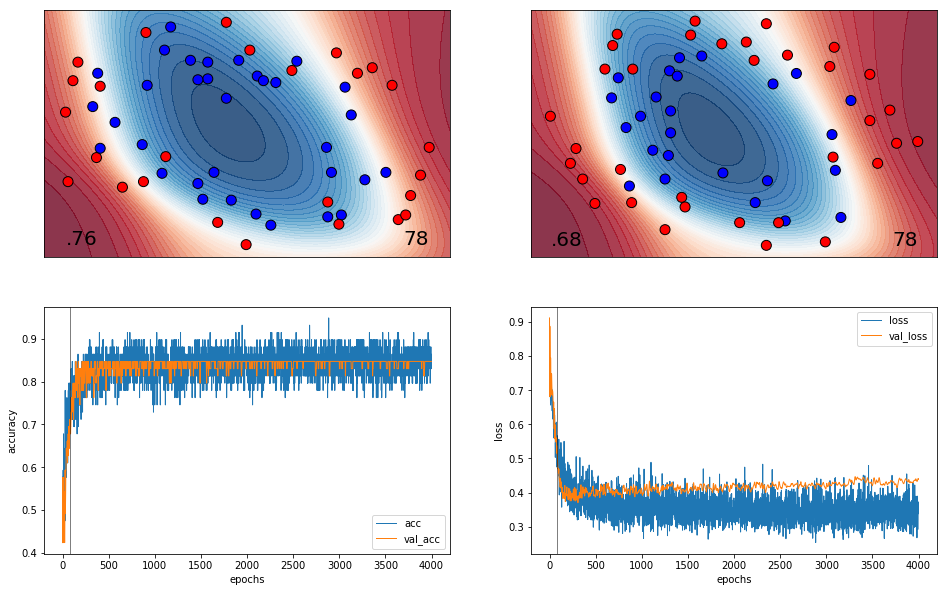

59/59 [==============================] - 0s 118us/step
83 0.7627118704682689 0.69491525322704


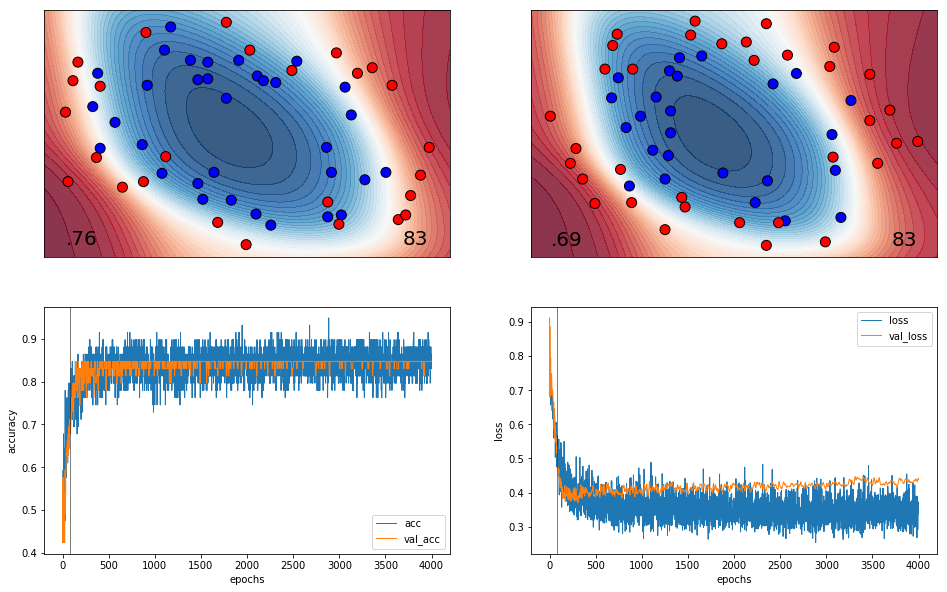

59/59 [==============================] - 0s 129us/step
88 0.7966101654505325 0.6779661107871492


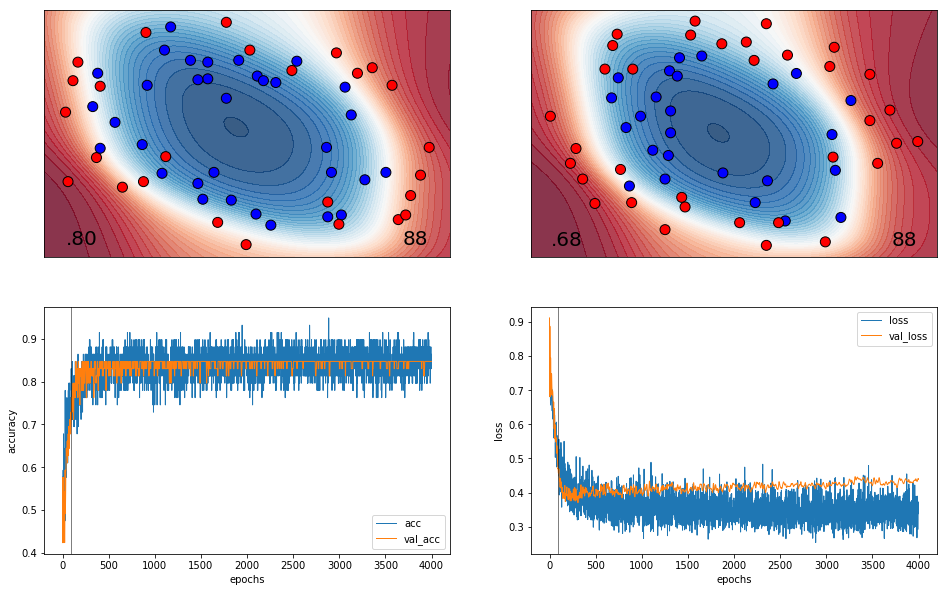

59/59 [==============================] - 0s 114us/step
94 0.7966101826247522 0.7288135583117857


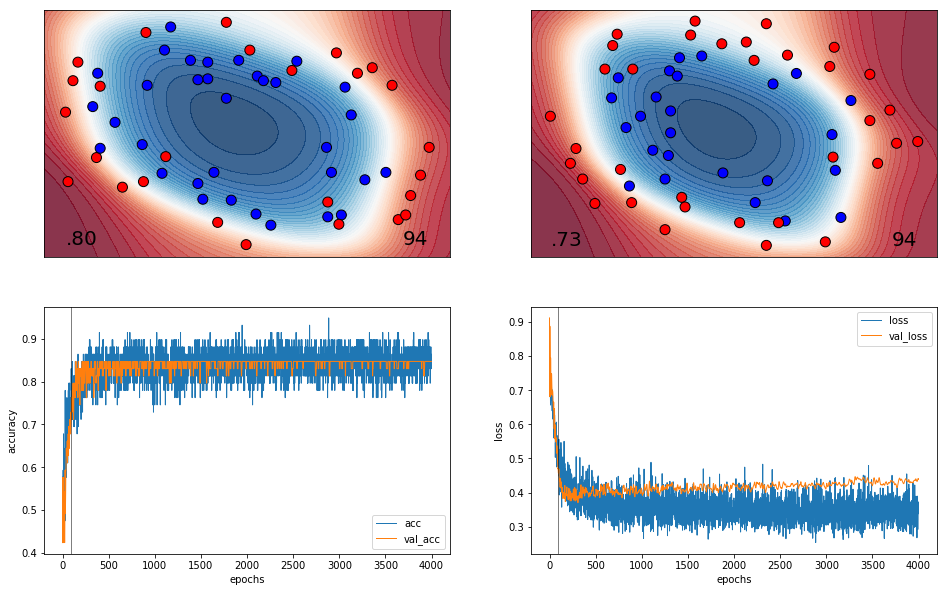

59/59 [==============================] - 0s 129us/step
101 0.7966101654505325 0.7288135583117857


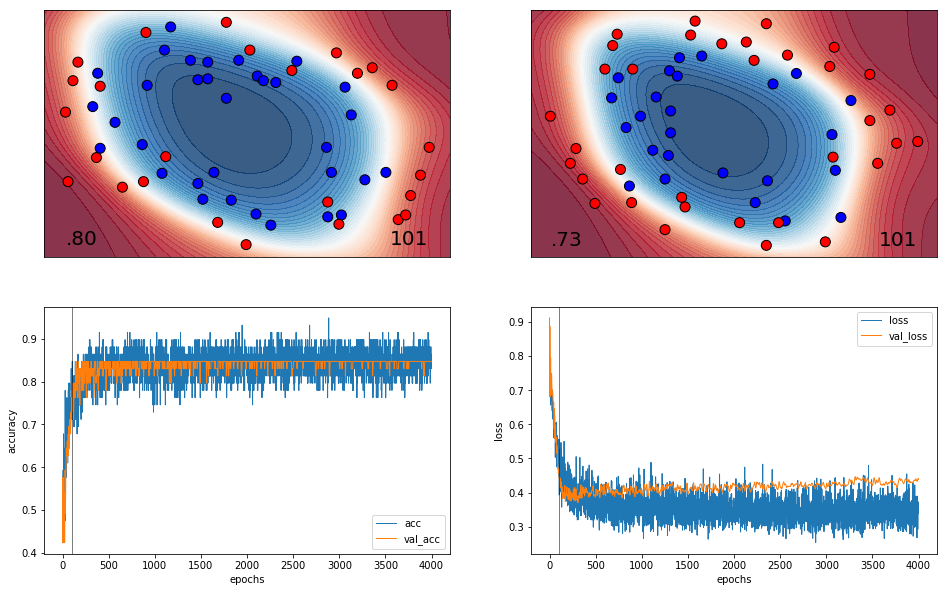

59/59 [==============================] - 0s 106us/step
108 0.8305084776070158 0.7796610058364222


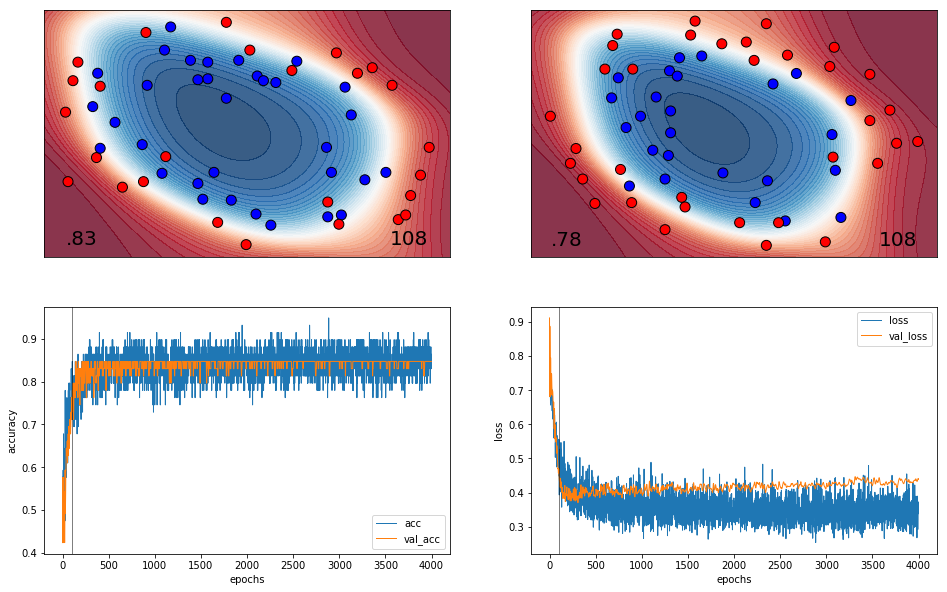

59/59 [==============================] - 0s 119us/step
115 0.8305084705352783 0.796610158378795


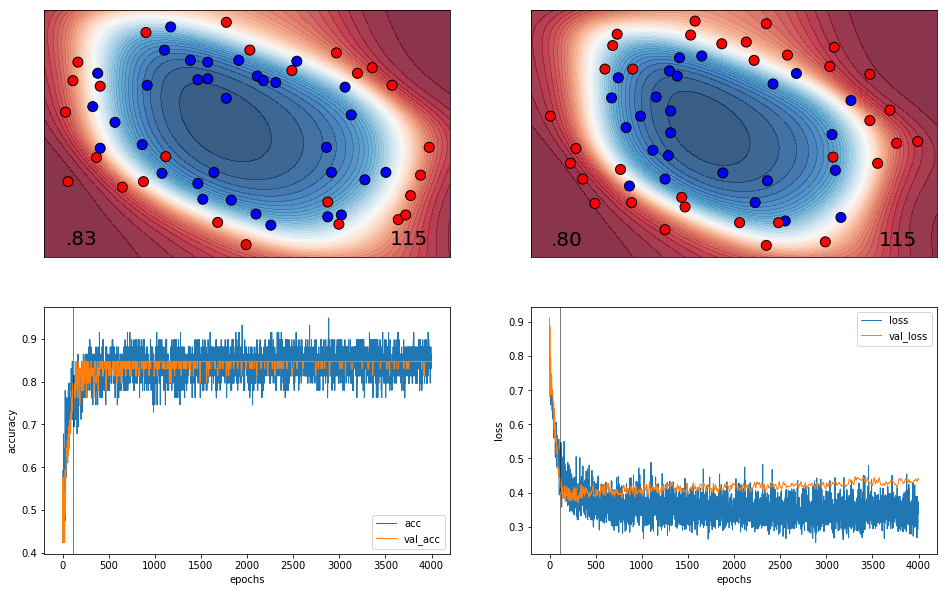

59/59 [==============================] - 0s 103us/step
123 0.830508487709498 0.7457627007516764


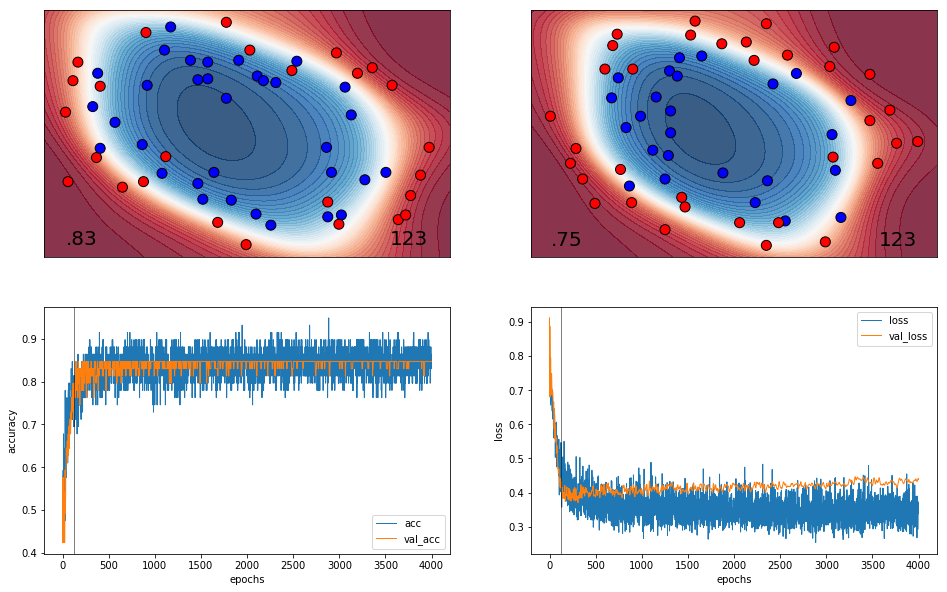

59/59 [==============================] - 0s 139us/step
131 0.8474576402518709 0.7627118532940492


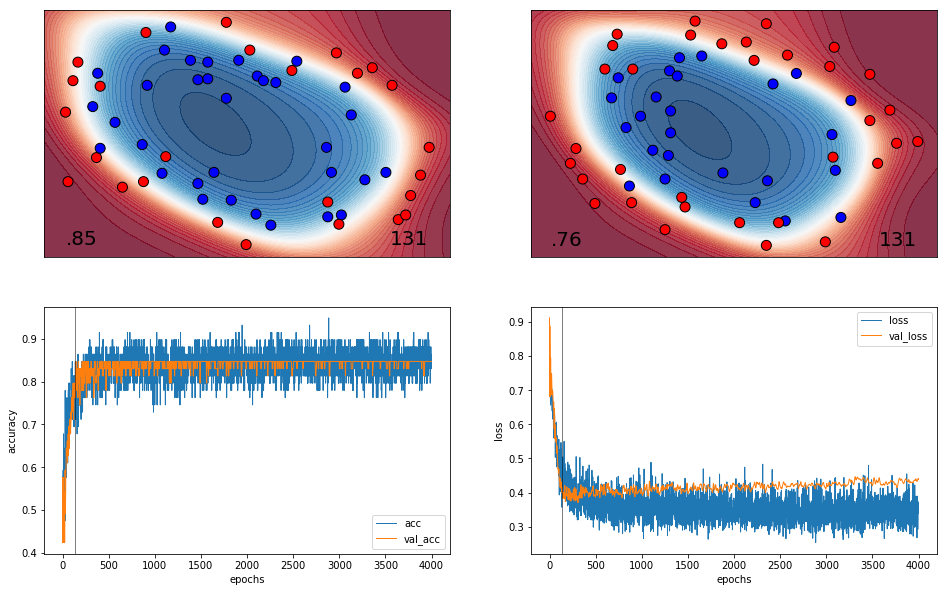

59/59 [==============================] - 0s 132us/step
140 0.8474576230776512 0.7627118532940492


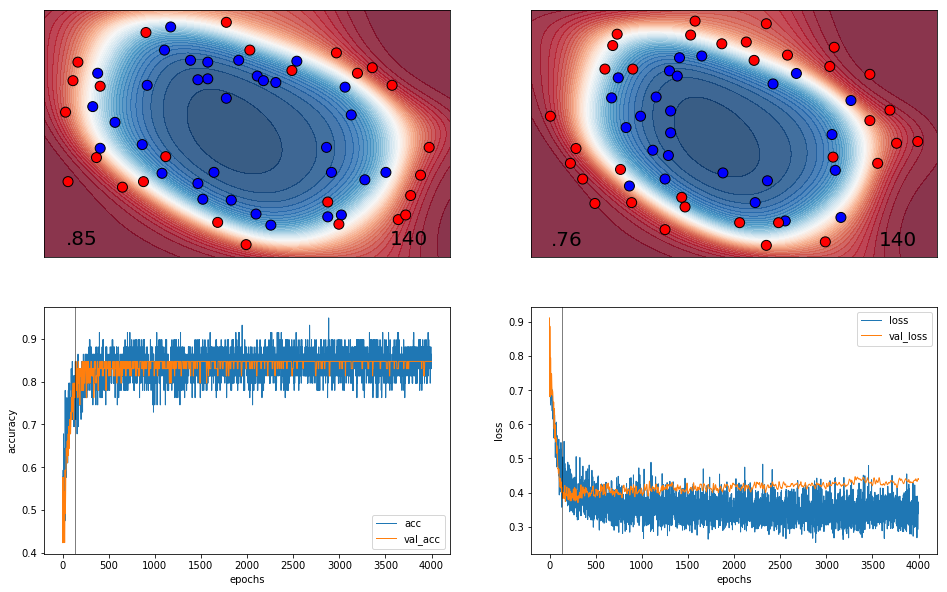

59/59 [==============================] - 0s 108us/step
150 0.8644067826917616 0.7796610058364222


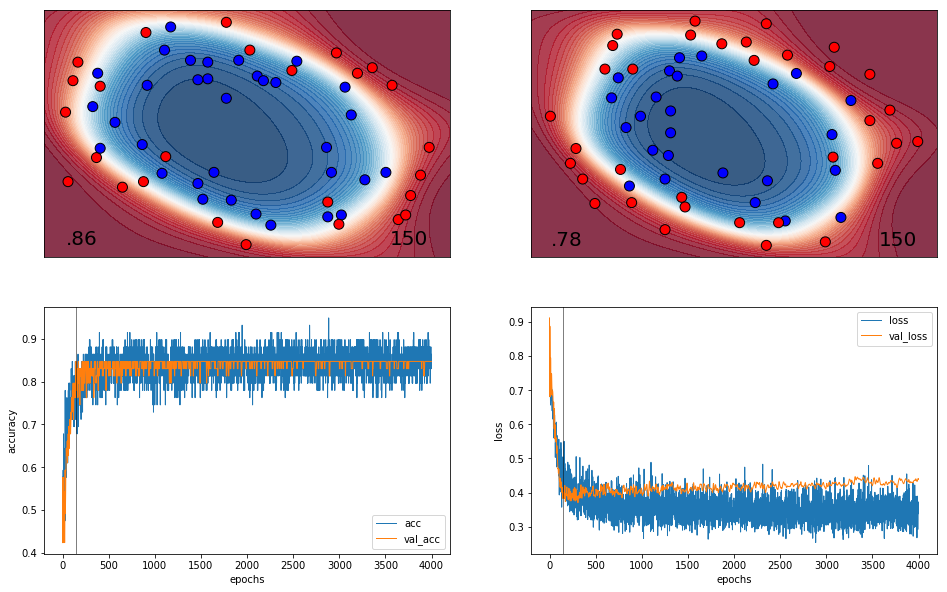

59/59 [==============================] - 0s 136us/step
160 0.830508487709498 0.8305084705352783


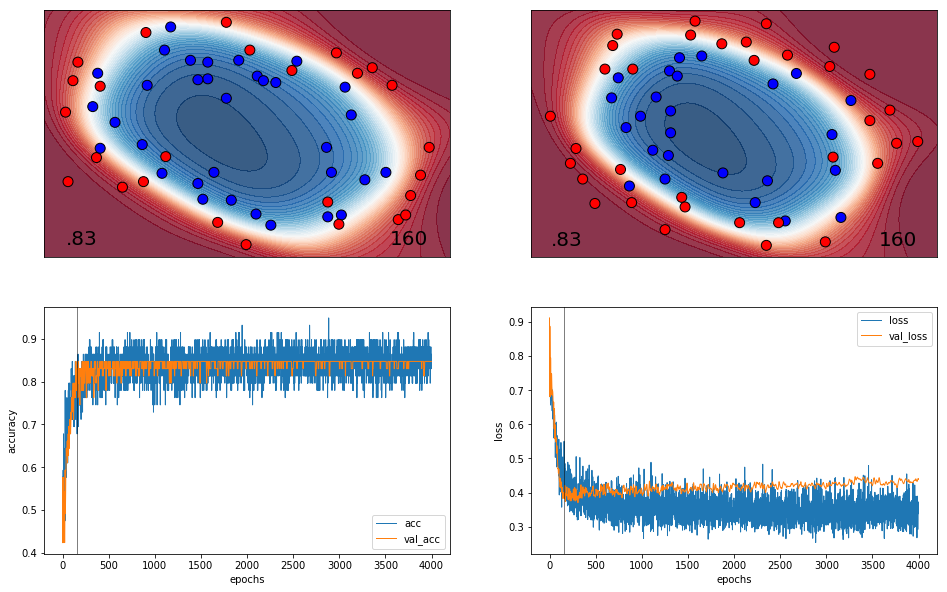

59/59 [==============================] - 0s 172us/step
171 0.7796610129081597 0.8474576230776512


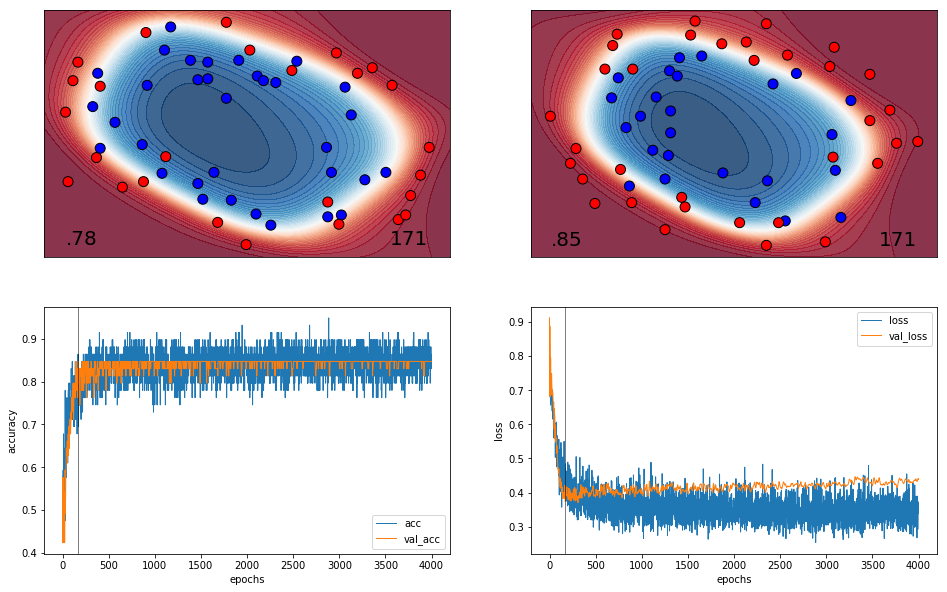

59/59 [==============================] - 0s 166us/step
182 0.8813559352341345 0.8305084806377605


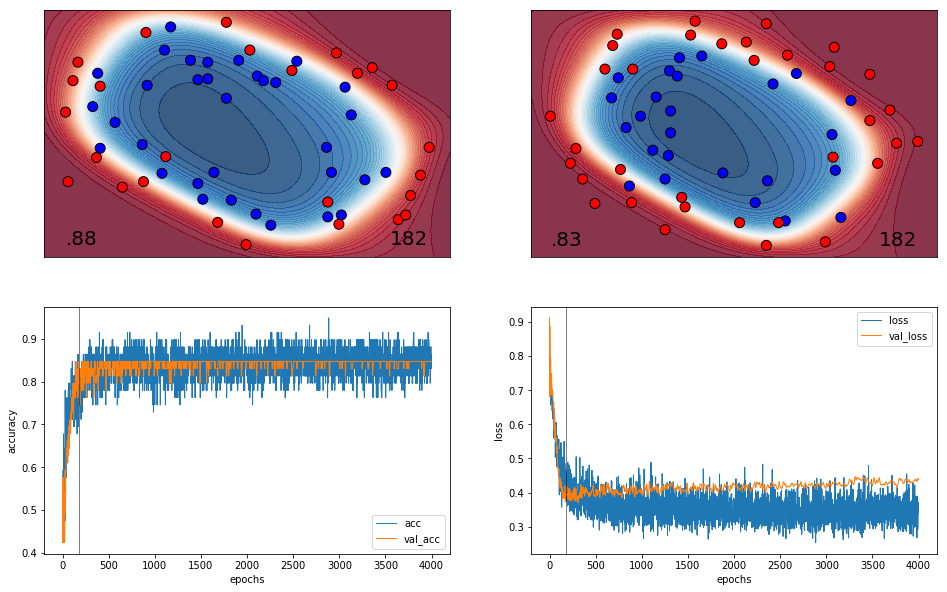

59/59 [==============================] - 0s 104us/step
195 0.8474576230776512 0.8305084806377605


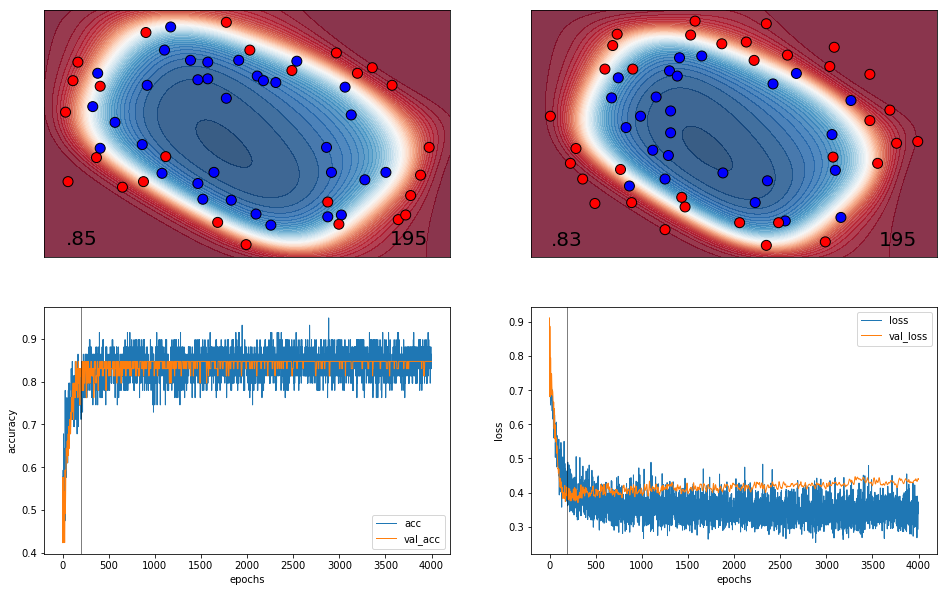

59/59 [==============================] - 0s 144us/step
208 0.8644067927942438 0.7796610058364222


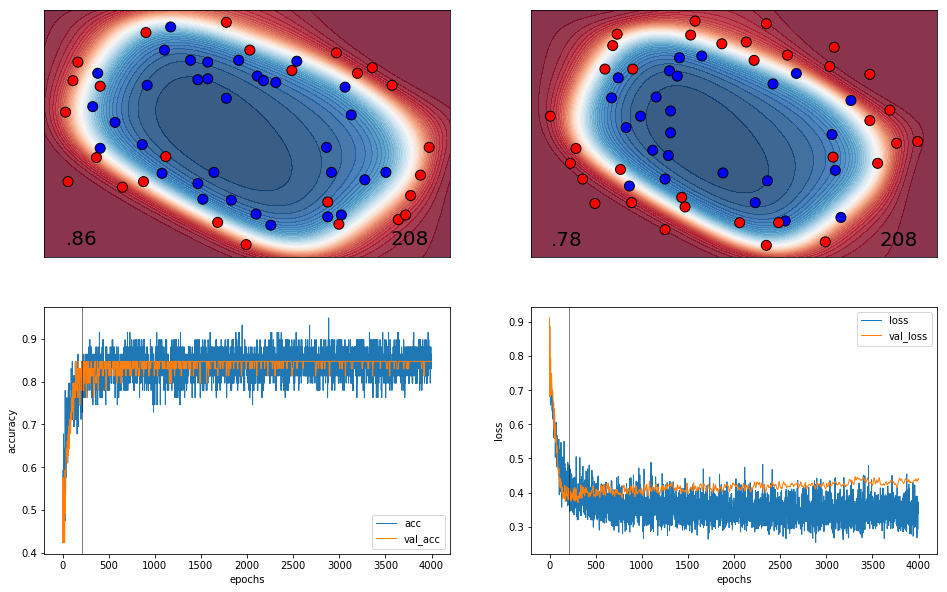

59/59 [==============================] - 0s 100us/step
222 0.8644067927942438 0.7796610058364222


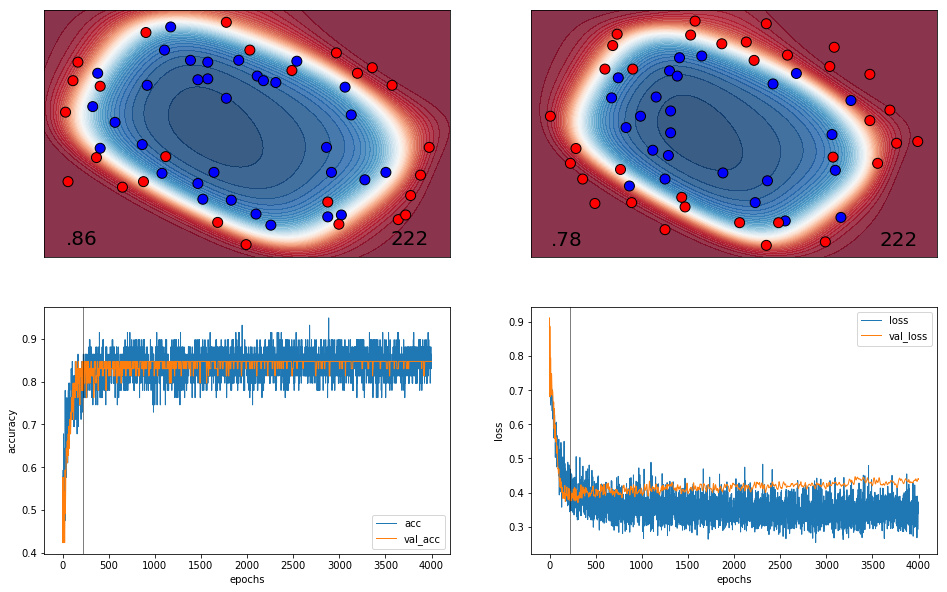

59/59 [==============================] - 0s 155us/step
237 0.8474576230776512 0.8305084705352783


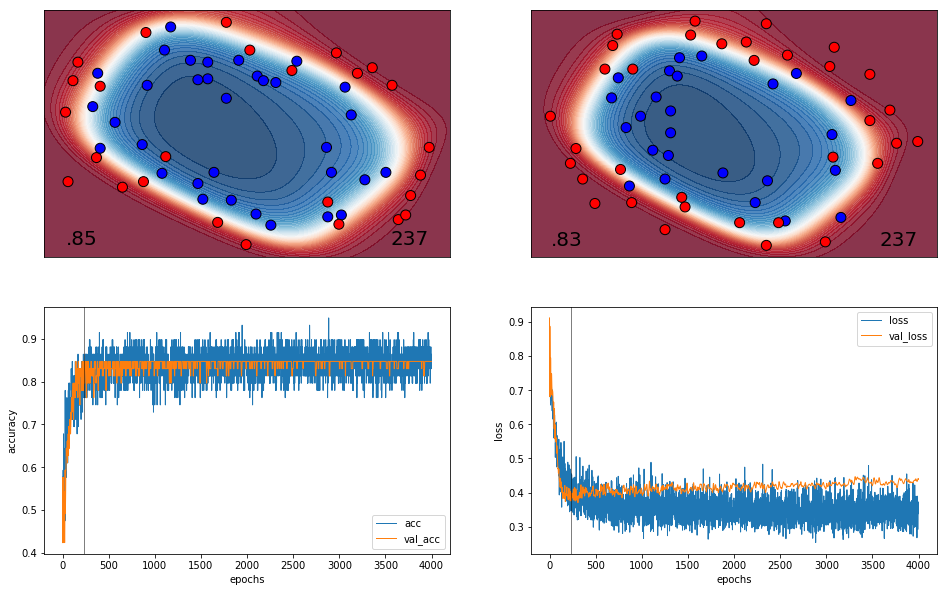

59/59 [==============================] - 0s 473us/step
253 0.8644067756200241 0.8474576230776512


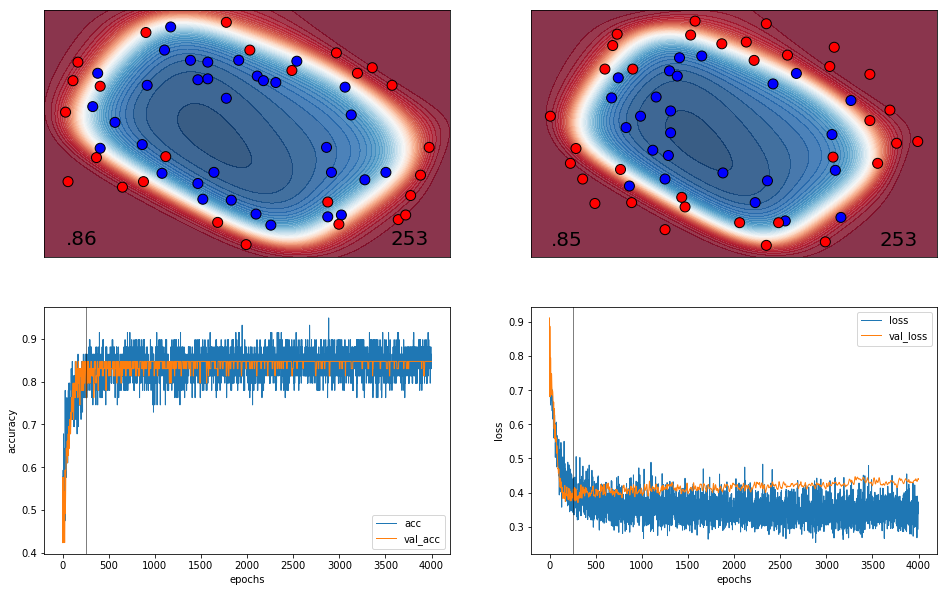

59/59 [==============================] - 0s 116us/step
270 0.8644067927942438 0.8135593280953876


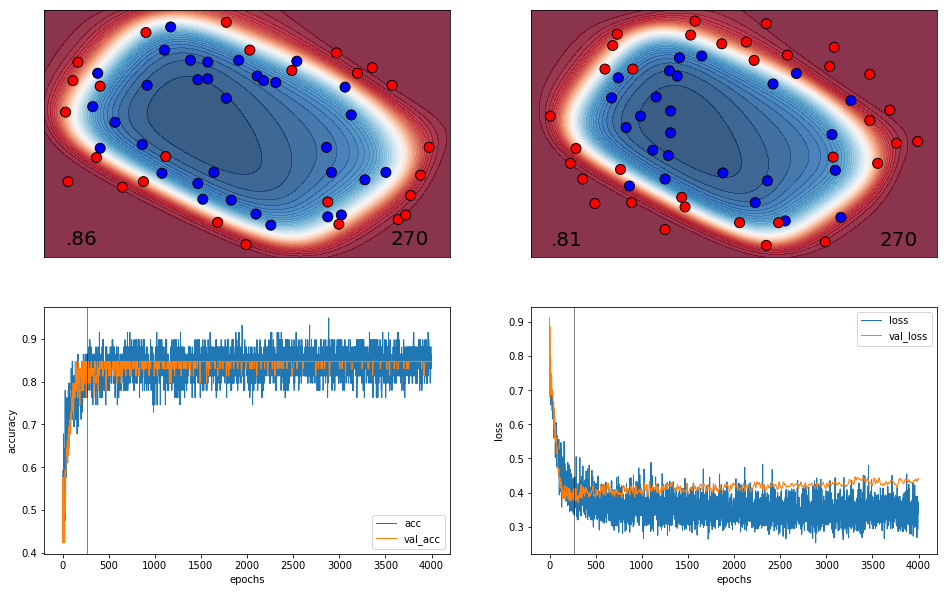

59/59 [==============================] - 0s 109us/step
289 0.8983050877765074 0.796610158378795


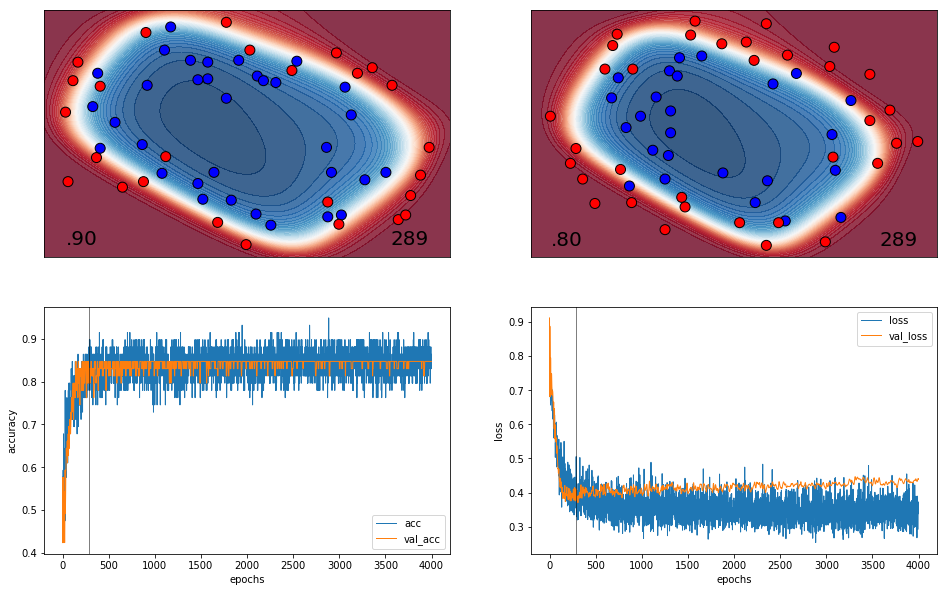

59/59 [==============================] - 0s 181us/step
308 0.8474576402518709 0.8474576230776512


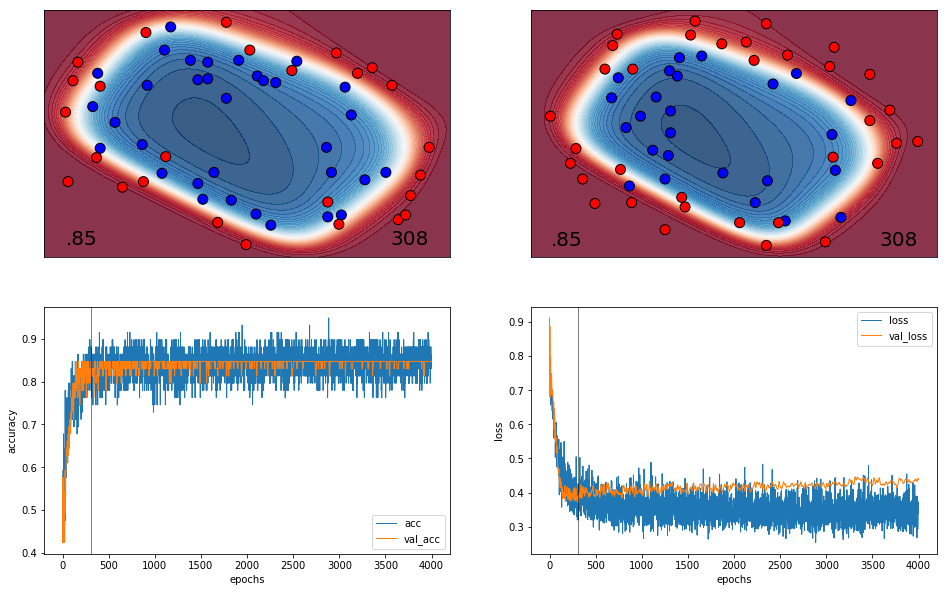

59/59 [==============================] - 0s 172us/step
329 0.8474576230776512 0.8135593280953876


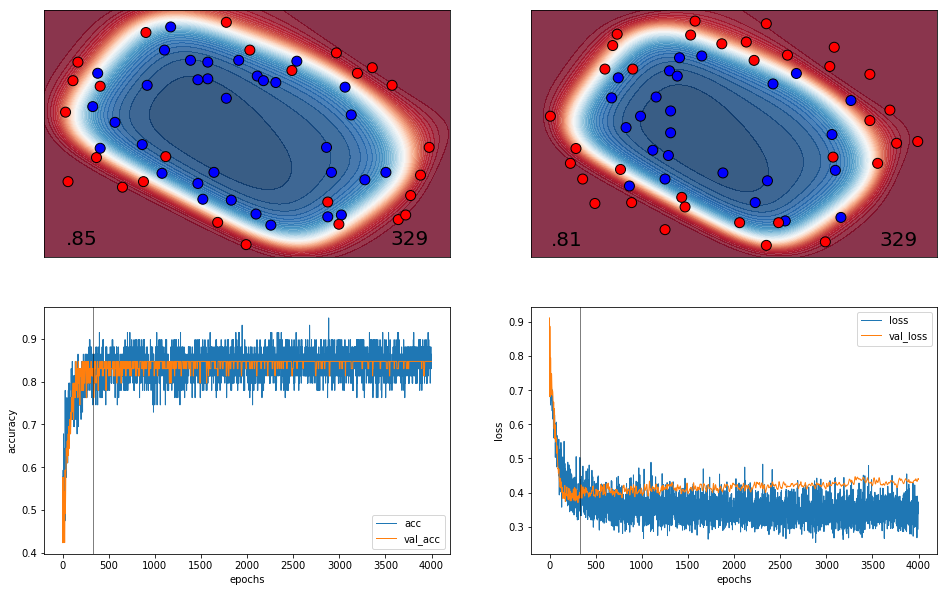

59/59 [==============================] - 0s 138us/step
352 0.8644067756200241 0.8305084705352783


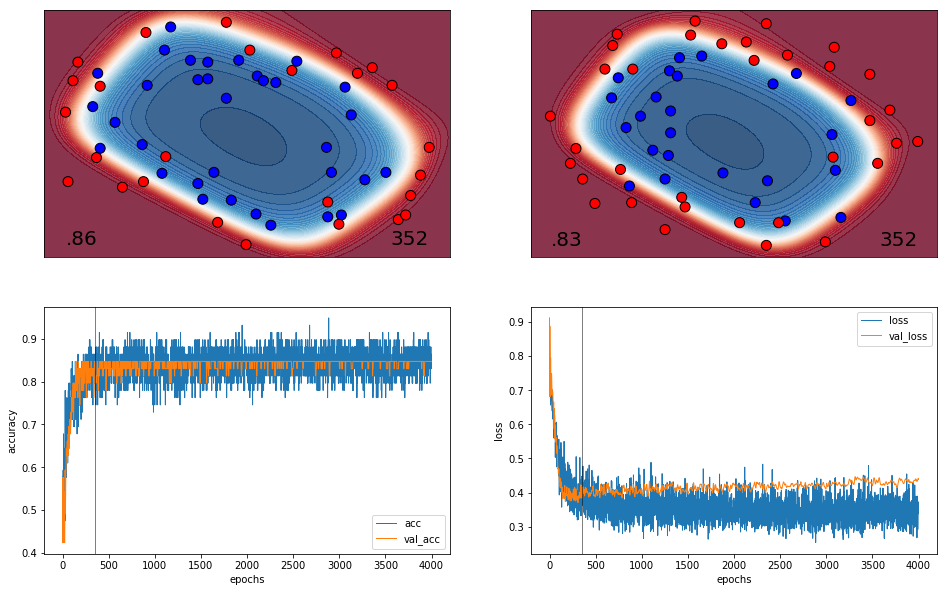

59/59 [==============================] - 0s 250us/step
375 0.8474576230776512 0.8135593280953876


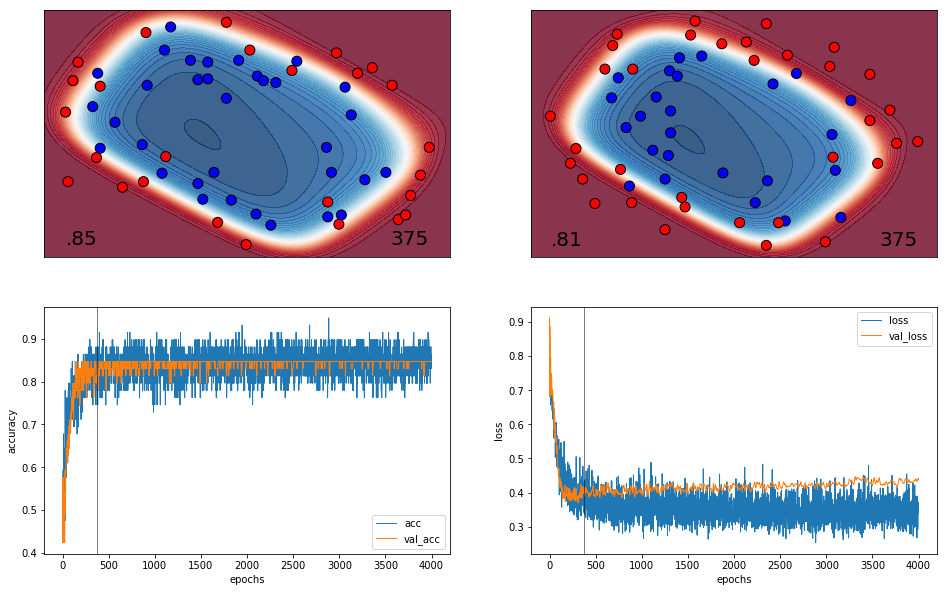

59/59 [==============================] - 0s 126us/step
401 0.8813559453366167 0.8305084705352783


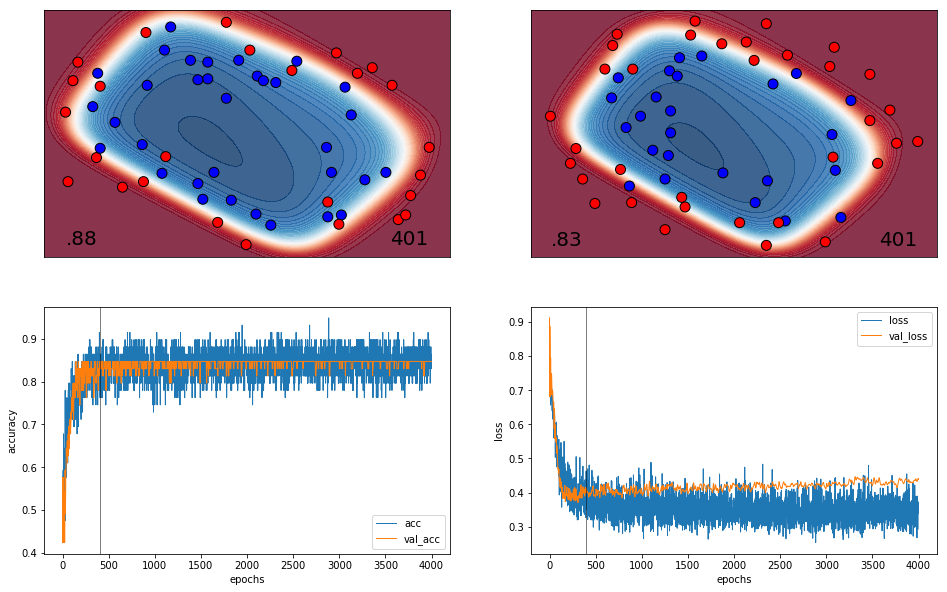

59/59 [==============================] - 0s 123us/step
428 0.8644067927942438 0.8474576230776512


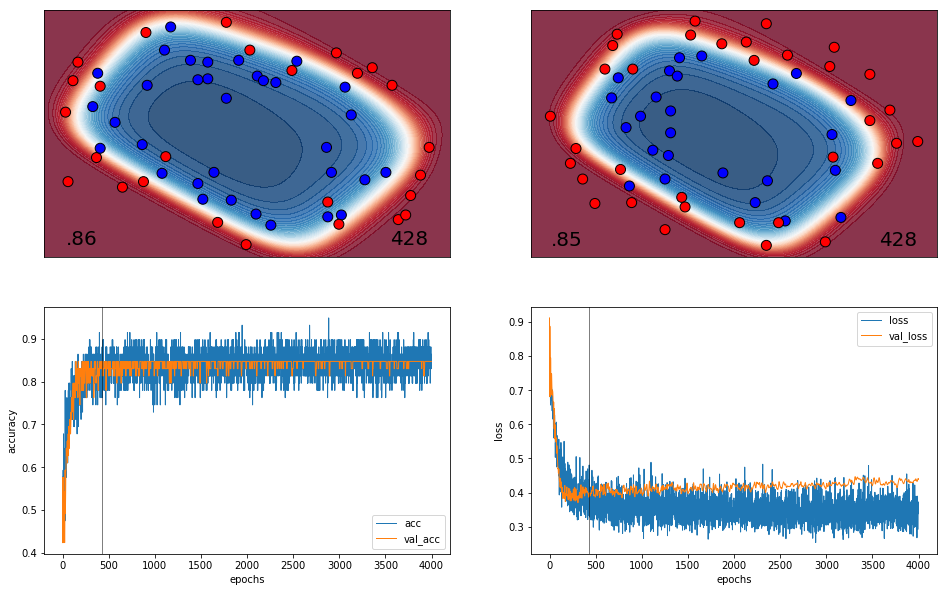

59/59 [==============================] - 0s 157us/step
457 0.8813559453366167 0.8305084705352783


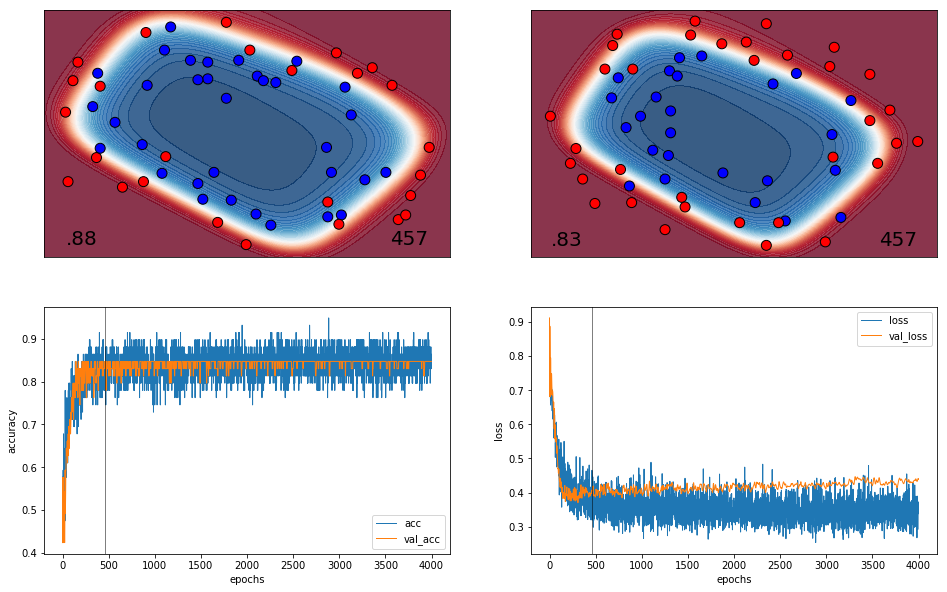

59/59 [==============================] - 0s 125us/step
488 0.8644067927942438 0.8305084705352783


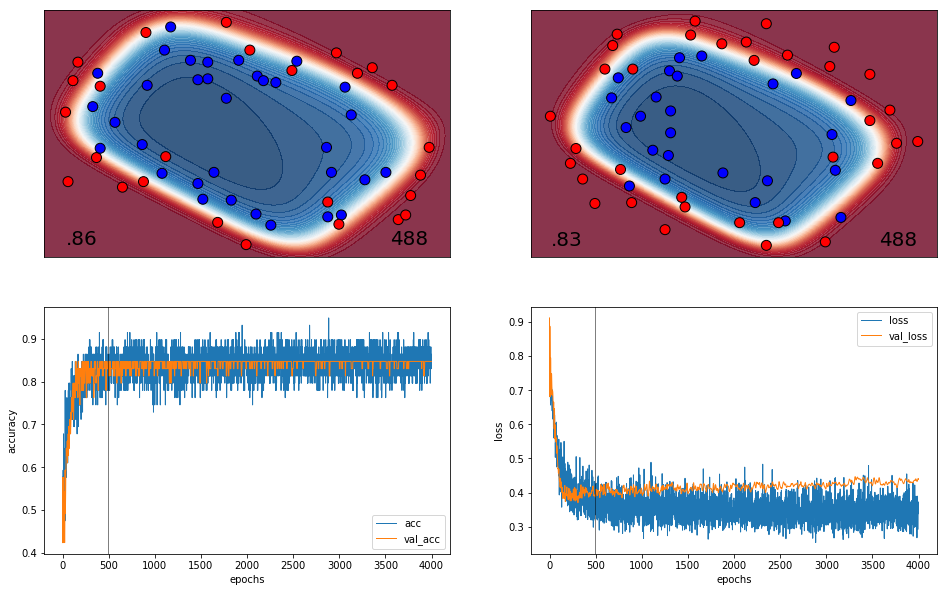

59/59 [==============================] - 0s 127us/step
522 0.8474576230776512 0.8135593280953876


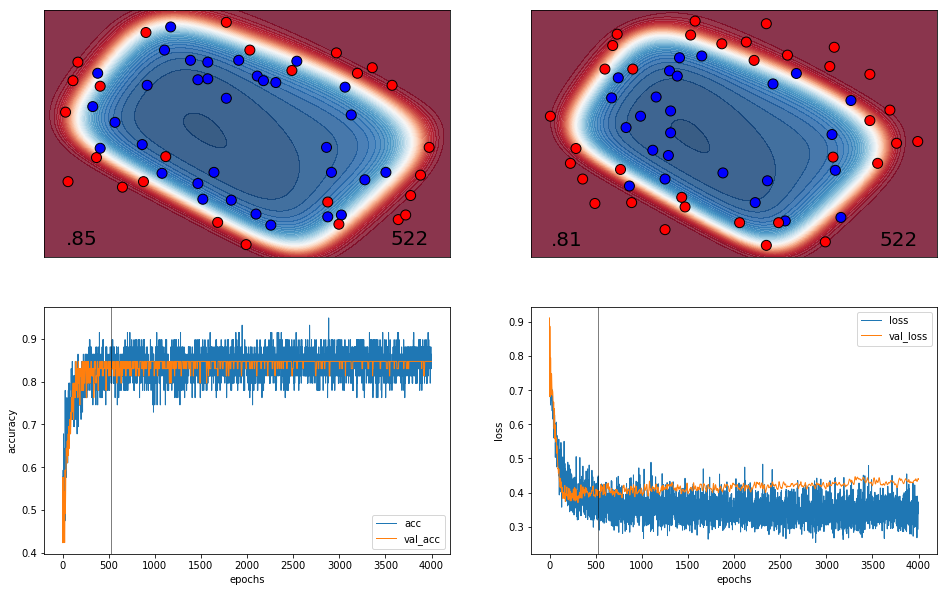

59/59 [==============================] - 0s 118us/step
557 0.8644067927942438 0.8305084705352783


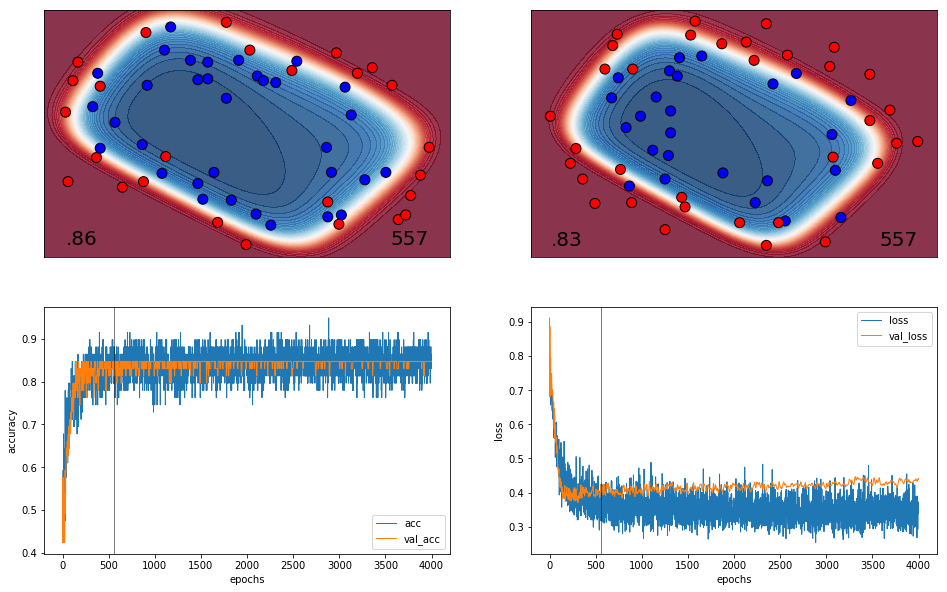

59/59 [==============================] - 0s 135us/step
595 0.8474576230776512 0.8474576230776512


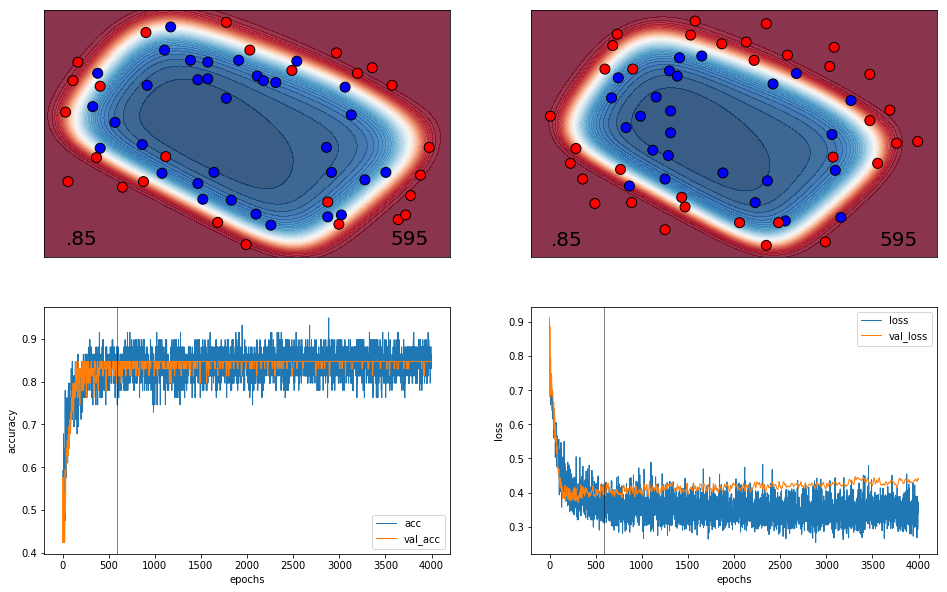

59/59 [==============================] - 0s 196us/step
635 0.8813559453366167 0.796610158378795


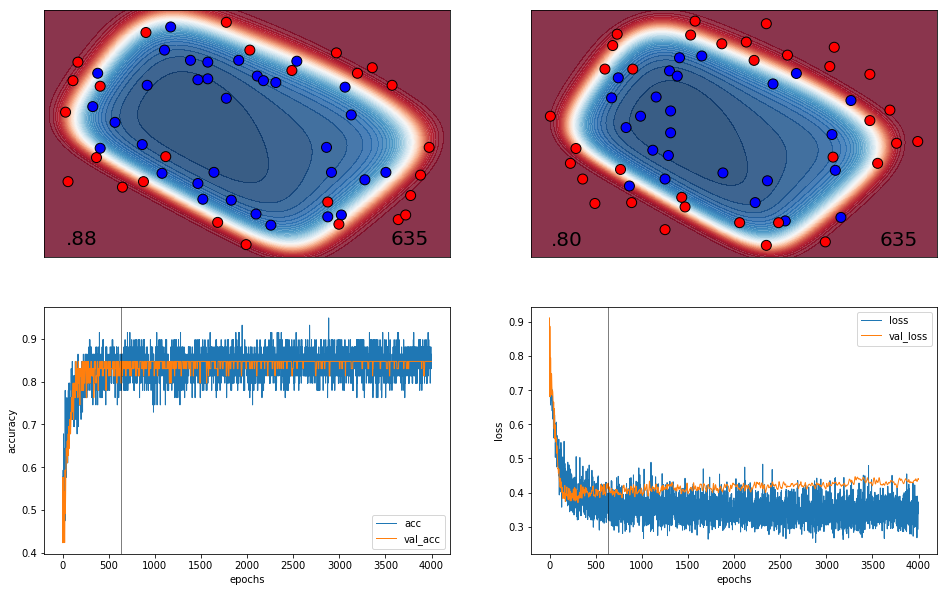

59/59 [==============================] - 0s 112us/step
678 0.8305084705352783 0.8474576230776512


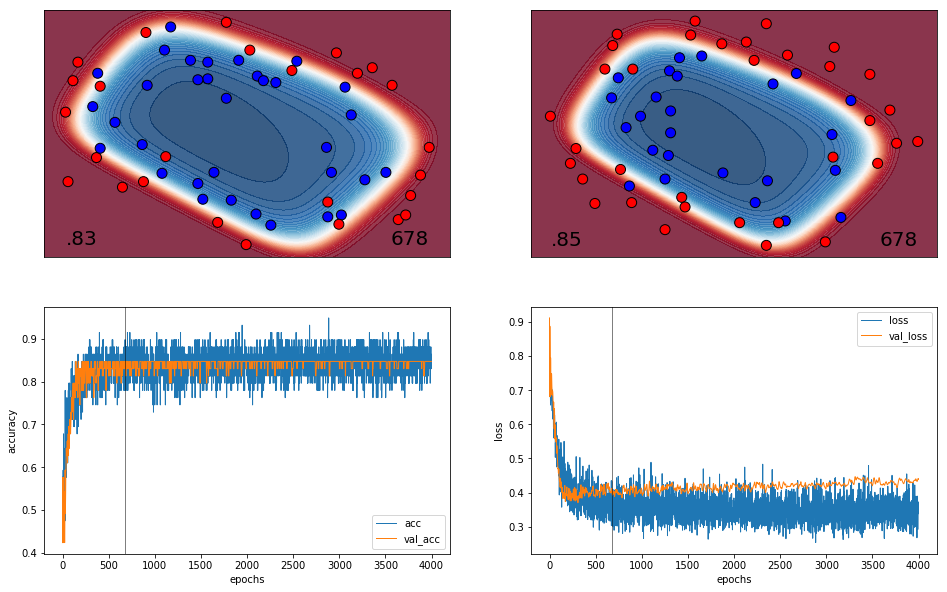

59/59 [==============================] - 0s 208us/step
724 0.8644067927942438 0.8474576230776512


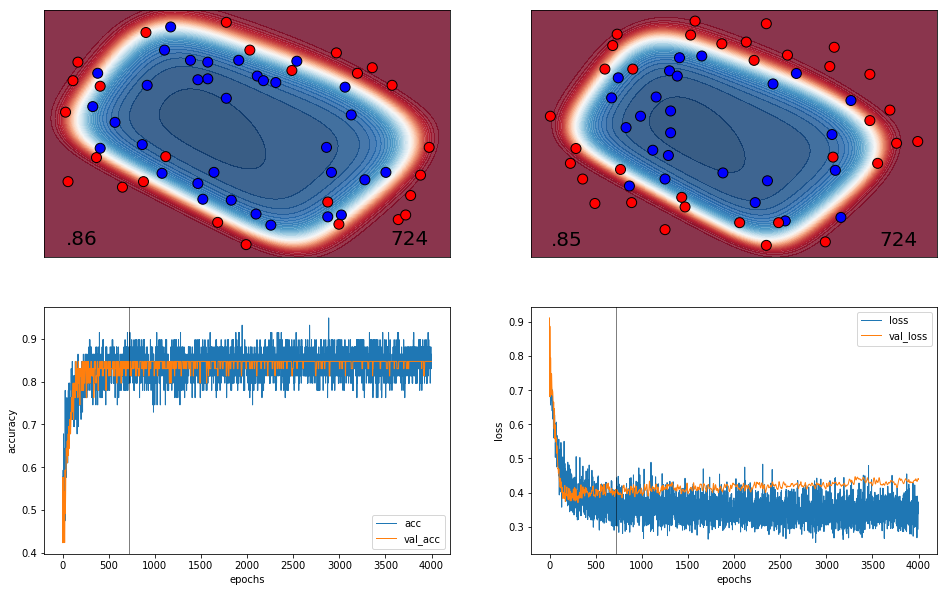

59/59 [==============================] - 0s 144us/step
774 0.8644067927942438 0.8305084705352783


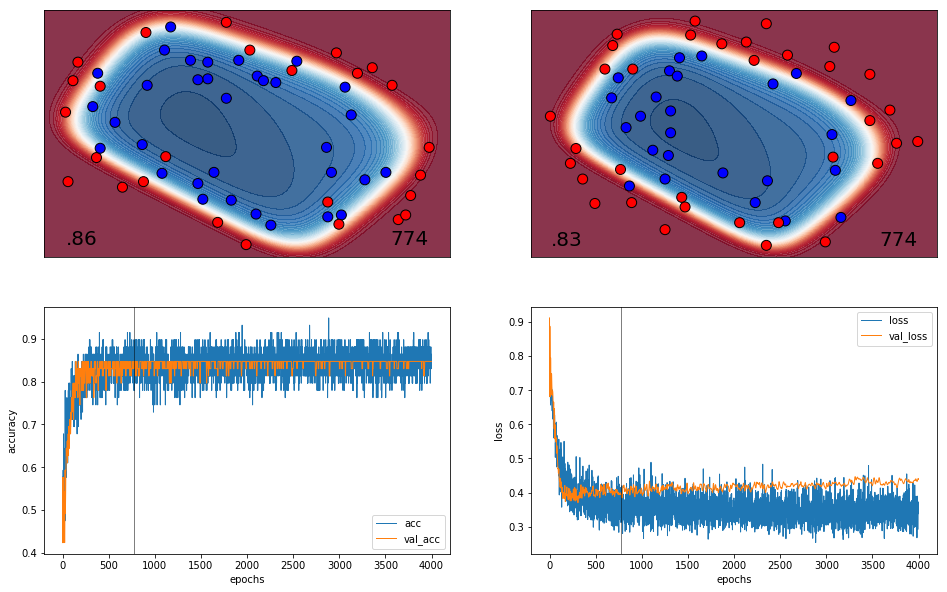

59/59 [==============================] - 0s 193us/step
826 0.8644067927942438 0.8305084705352783


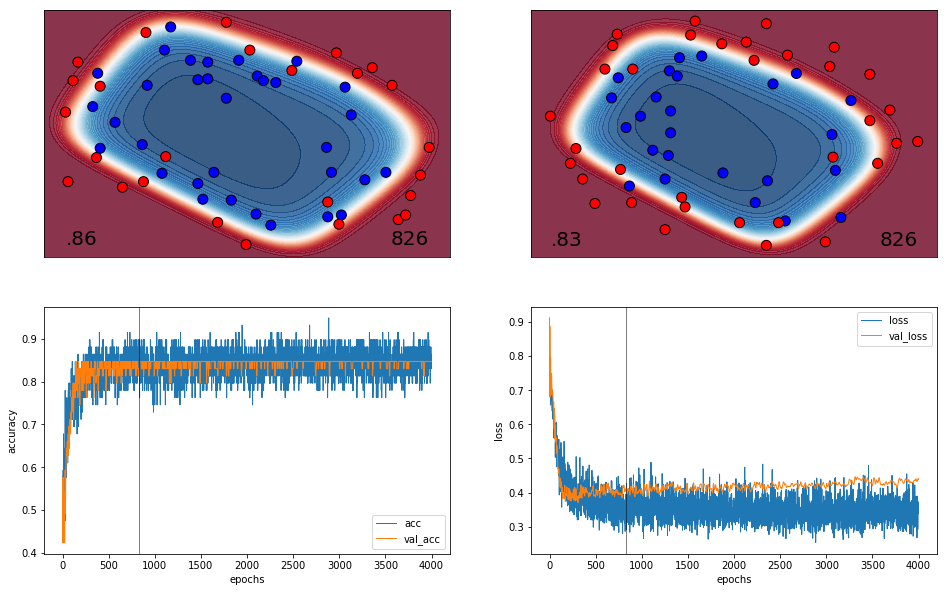

59/59 [==============================] - 0s 160us/step
882 0.8644067927942438 0.8305084705352783


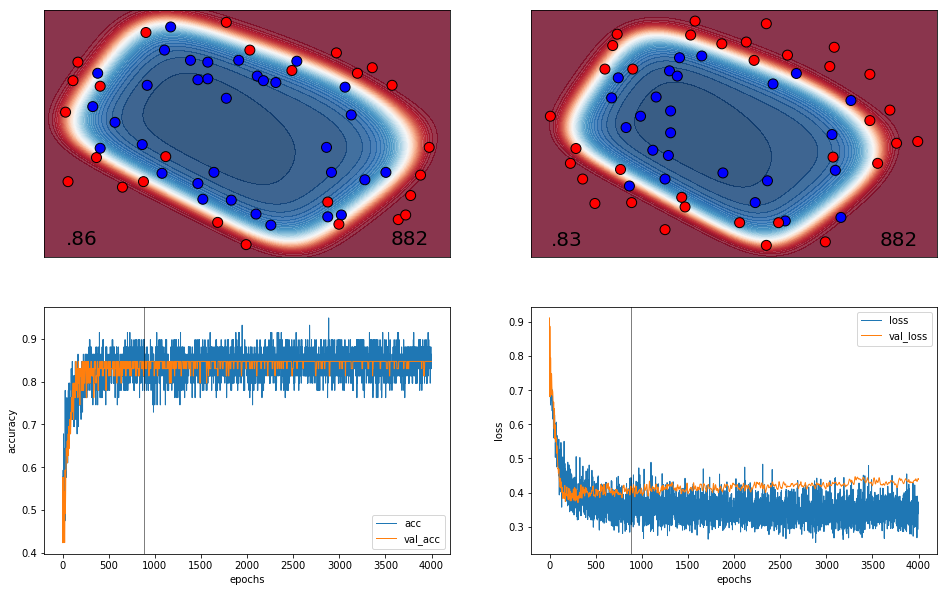

59/59 [==============================] - 0s 189us/step
942 0.8644067927942438 0.8305084705352783


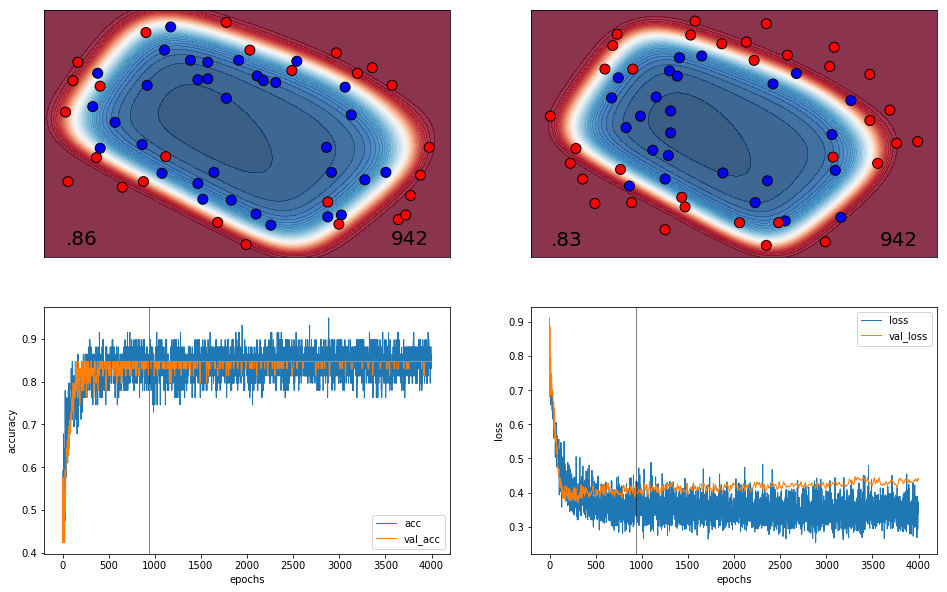

59/59 [==============================] - 0s 172us/step
1006 0.8813559453366167 0.8474576230776512


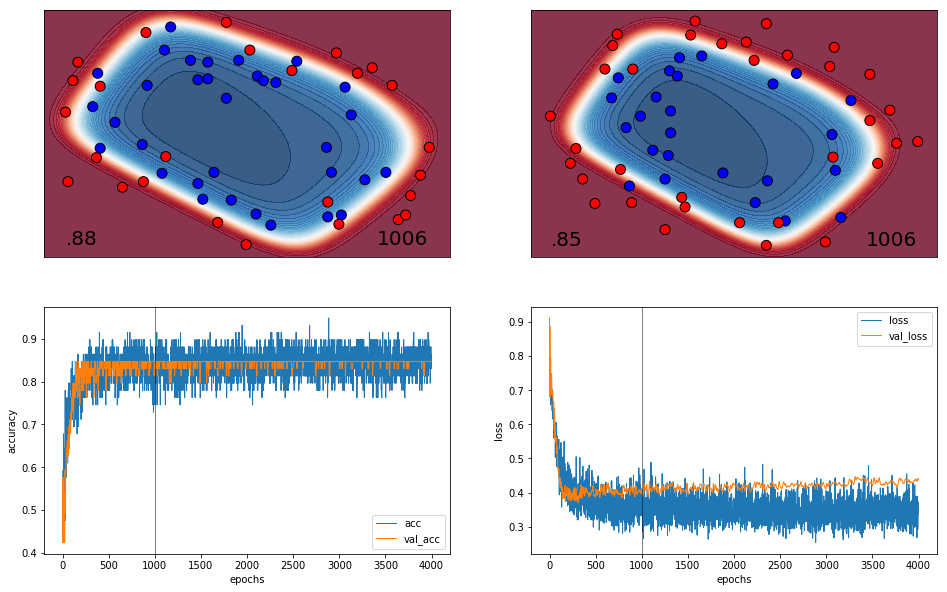

59/59 [==============================] - 0s 113us/step
1075 0.8644067927942438 0.8474576230776512


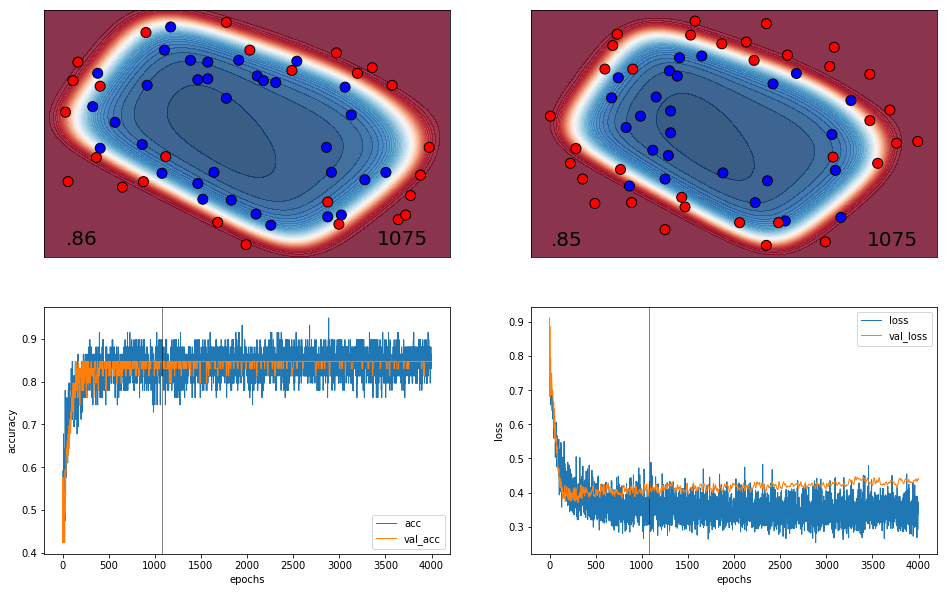

59/59 [==============================] - 0s 137us/step
1148 0.8644067927942438 0.8474576230776512


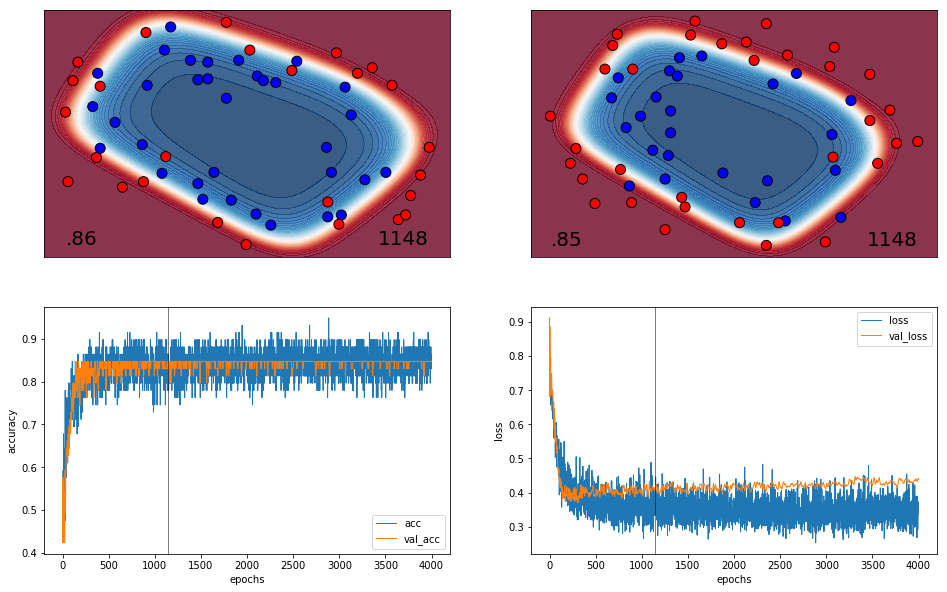

59/59 [==============================] - 0s 98us/step
1226 0.8474576402518709 0.8474576230776512


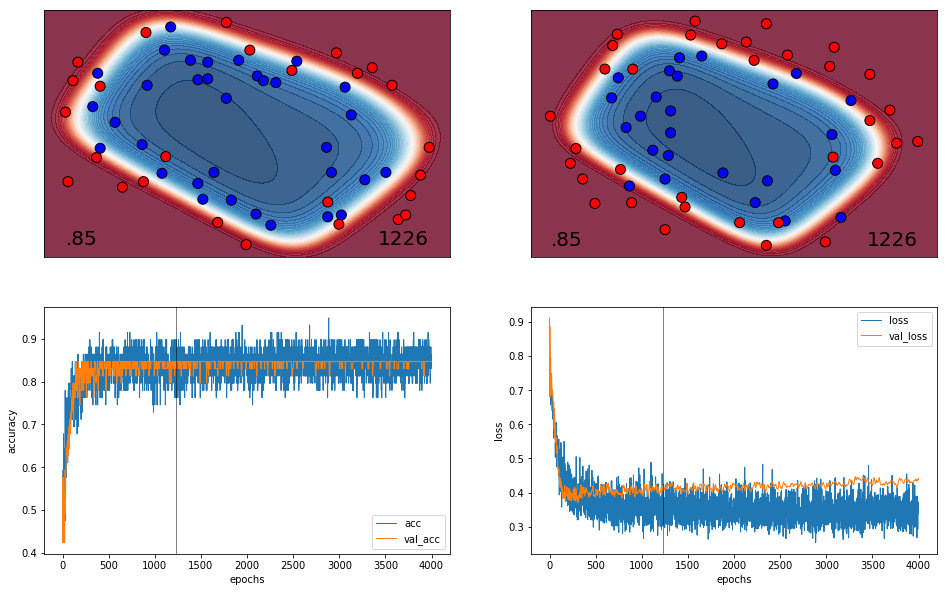

59/59 [==============================] - 0s 111us/step
1309 0.8644067927942438 0.8474576230776512


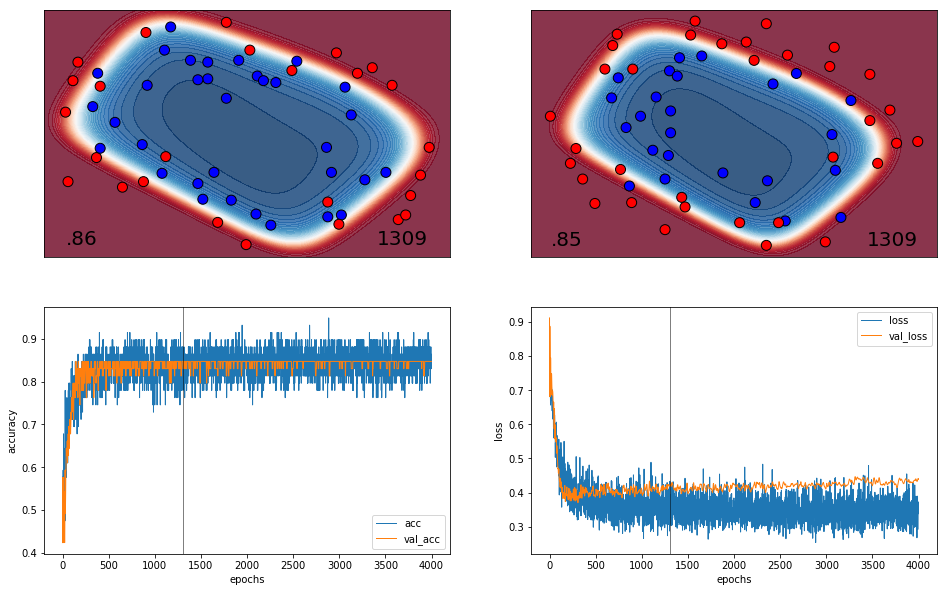

59/59 [==============================] - 0s 143us/step
1398 0.830508487709498 0.8474576230776512


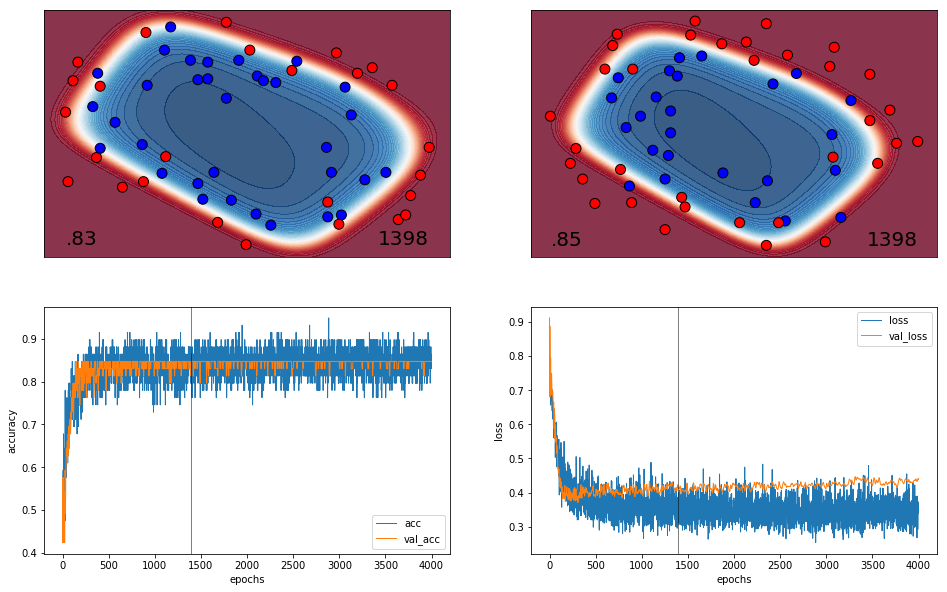

59/59 [==============================] - 0s 92us/step
1493 0.8983050877765074 0.796610158378795


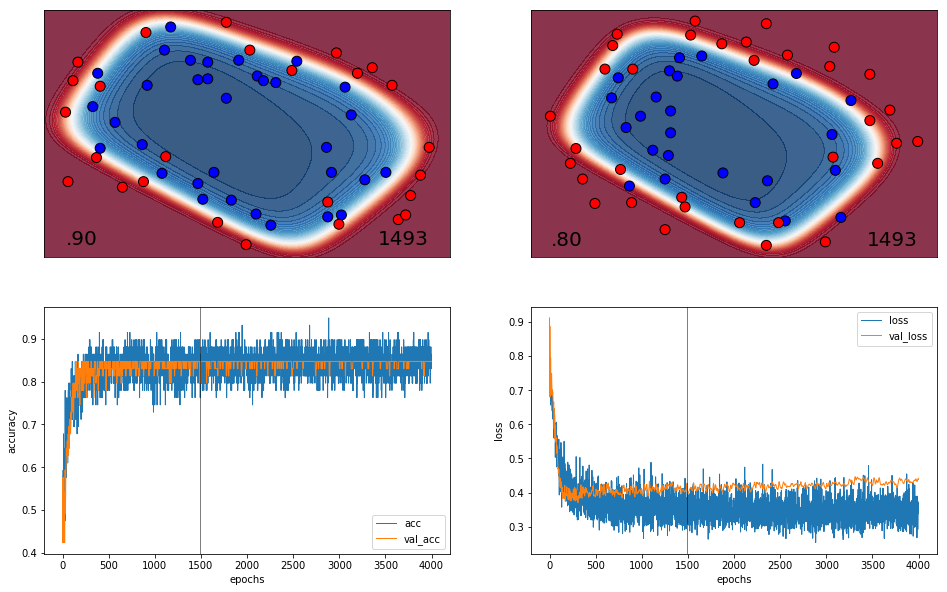

59/59 [==============================] - 0s 129us/step
1594 0.8644067927942438 0.8305084705352783


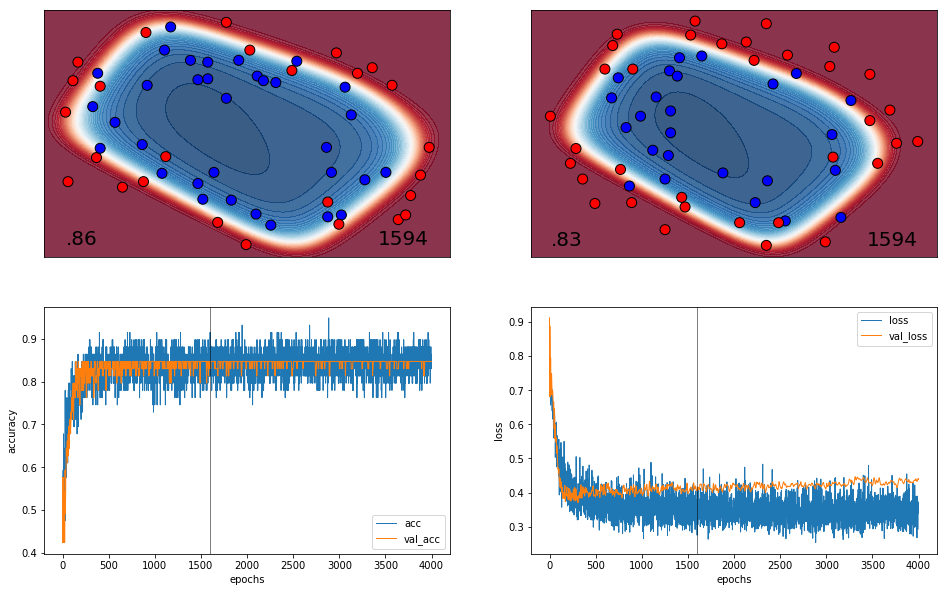

59/59 [==============================] - 0s 104us/step
1702 0.8474576402518709 0.8474576230776512


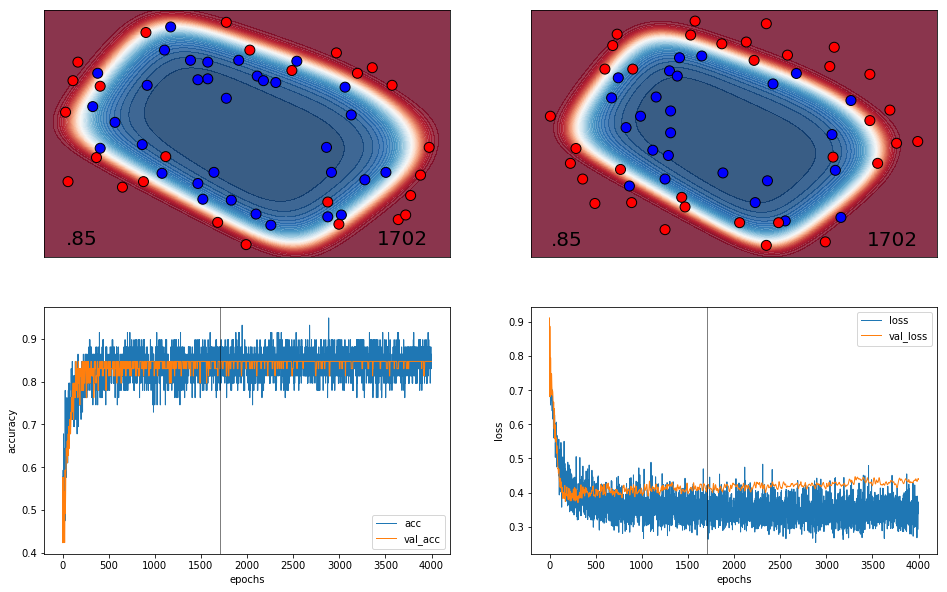

59/59 [==============================] - 0s 116us/step
1818 0.8813559453366167 0.8305084705352783


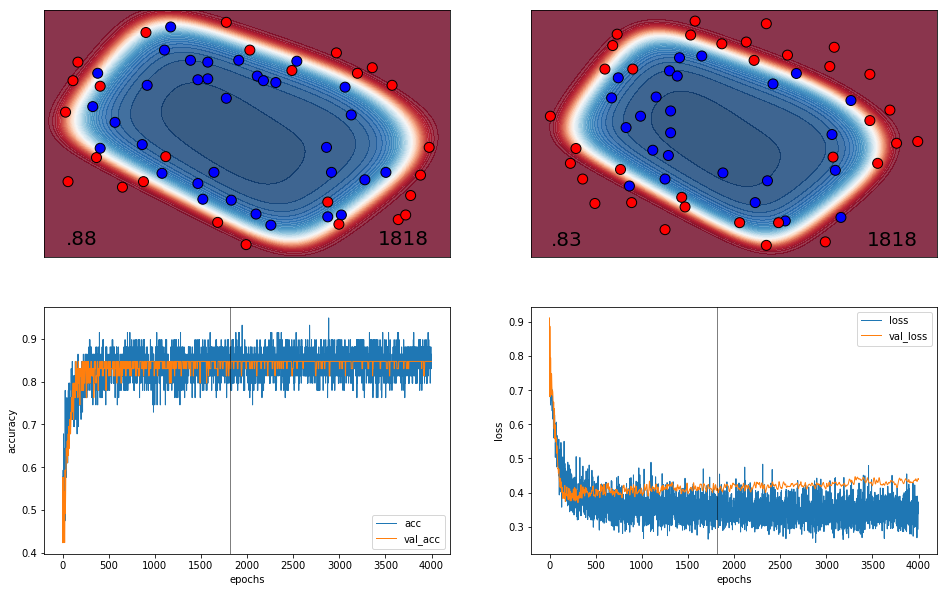

59/59 [==============================] - 0s 114us/step
1941 0.8474576230776512 0.8135593280953876


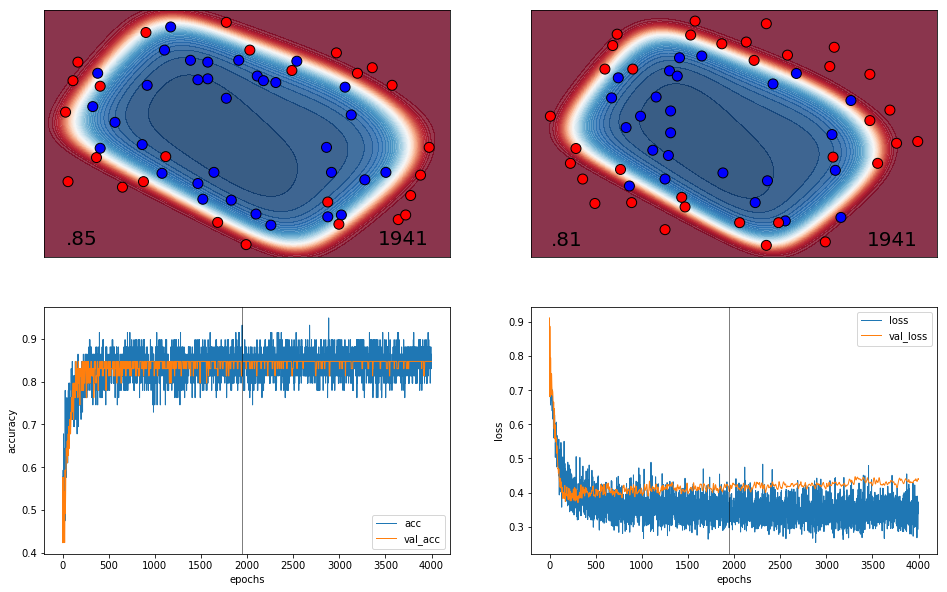

59/59 [==============================] - 0s 123us/step
2073 0.8644067927942438 0.8474576230776512


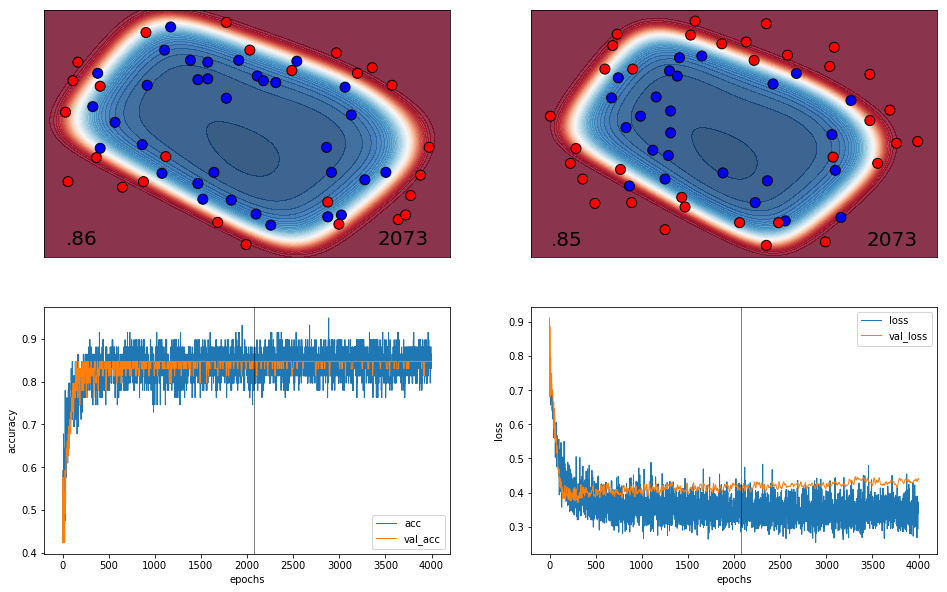

59/59 [==============================] - 0s 137us/step
2214 0.8644067927942438 0.8474576230776512


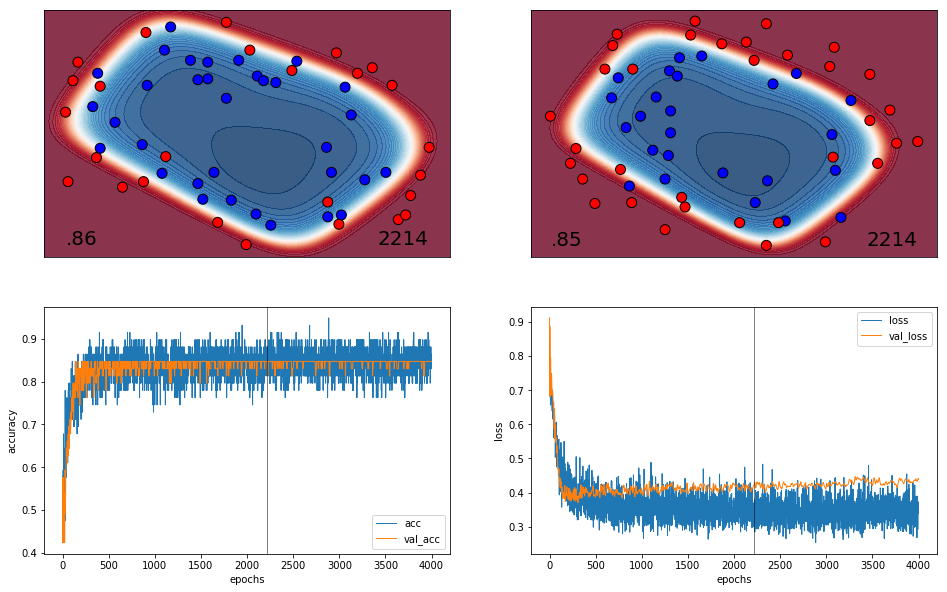

59/59 [==============================] - 0s 126us/step
2364 0.8644067927942438 0.8474576230776512


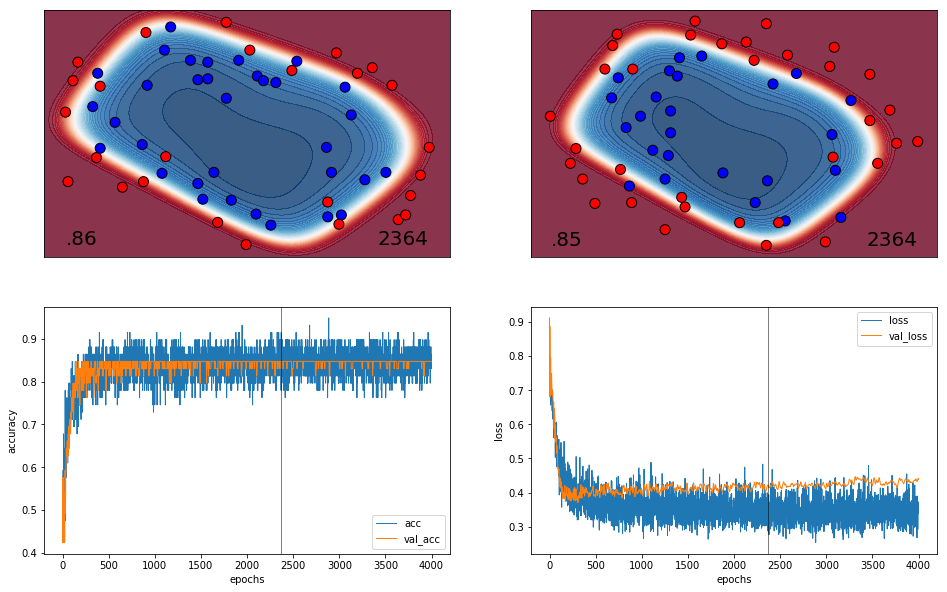

59/59 [==============================] - 0s 106us/step
2525 0.8644067927942438 0.8474576230776512


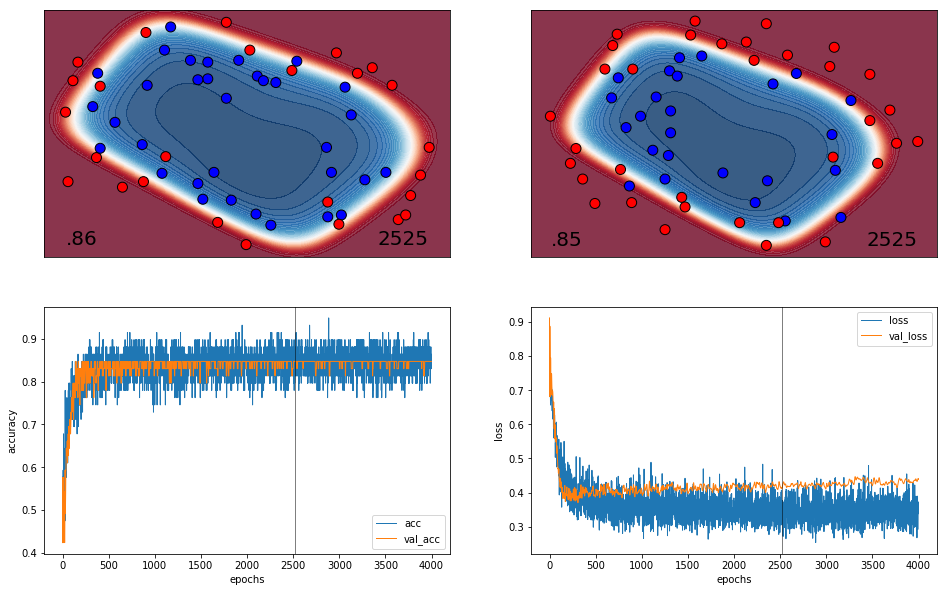

59/59 [==============================] - 0s 102us/step
2697 0.8474576402518709 0.8474576230776512


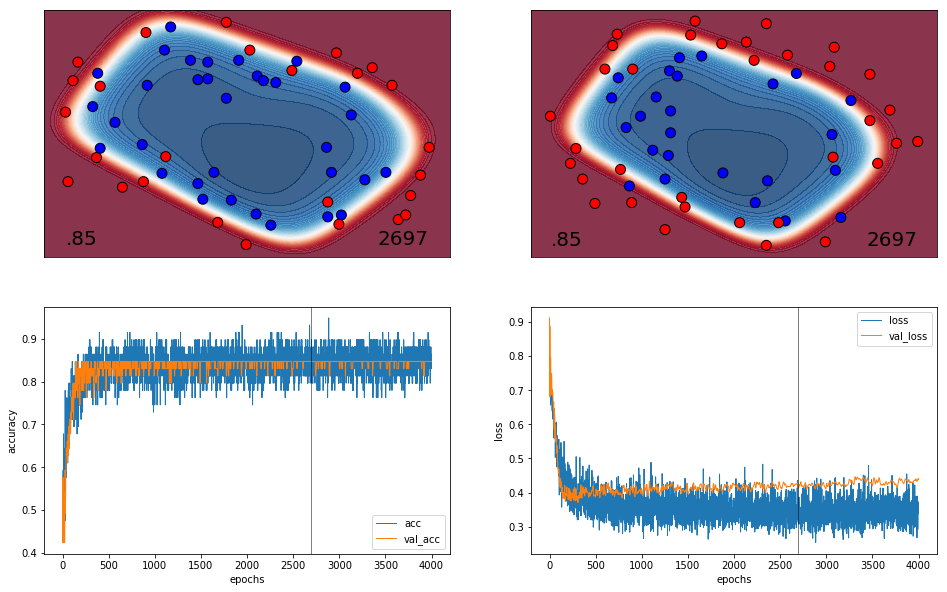

59/59 [==============================] - 0s 134us/step
2880 0.8474576402518709 0.8474576230776512


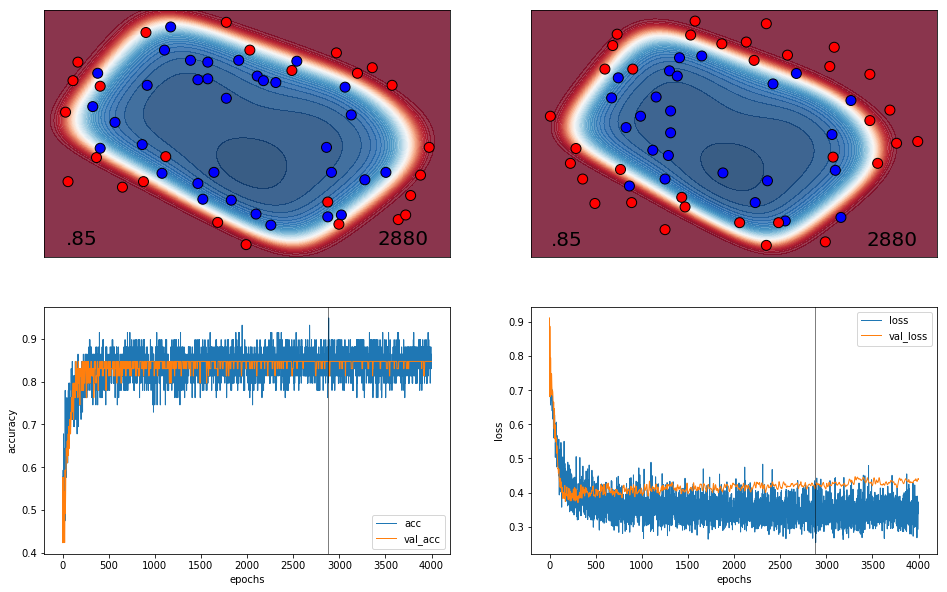

59/59 [==============================] - 0s 81us/step
3075 0.8644067927942438 0.8474576230776512


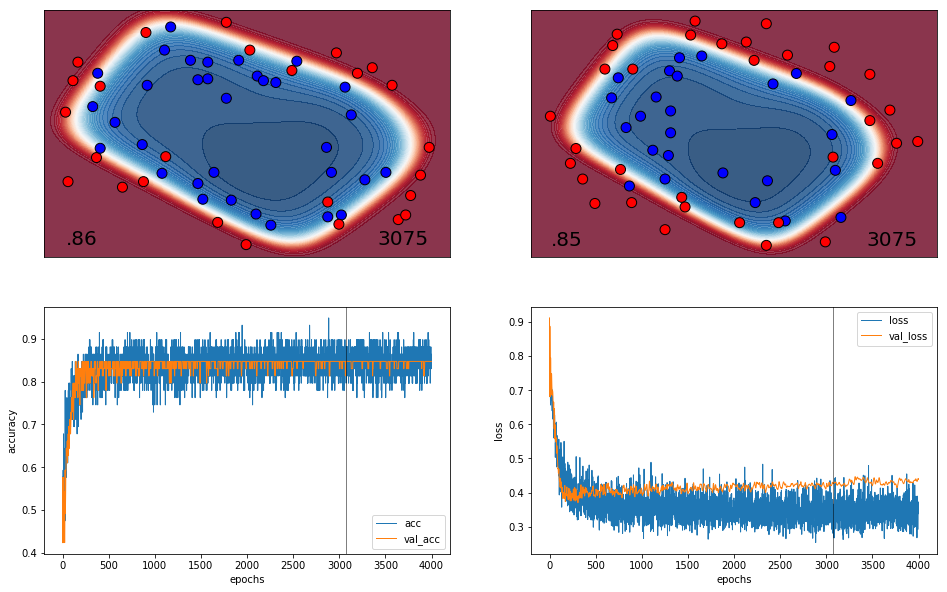

59/59 [==============================] - 0s 178us/step
3284 0.8644067927942438 0.8474576230776512


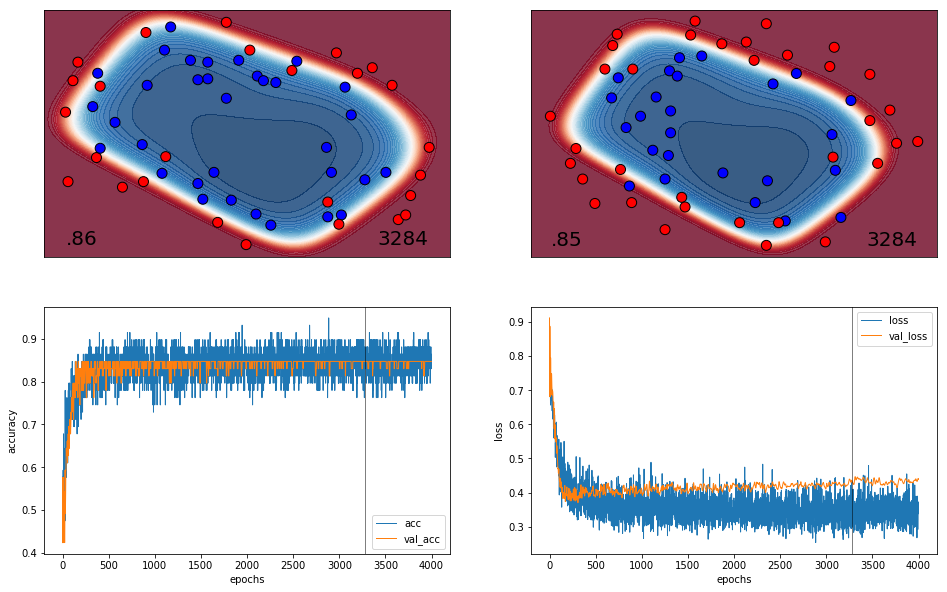

59/59 [==============================] - 0s 147us/step
3507 0.8813559453366167 0.8474576230776512


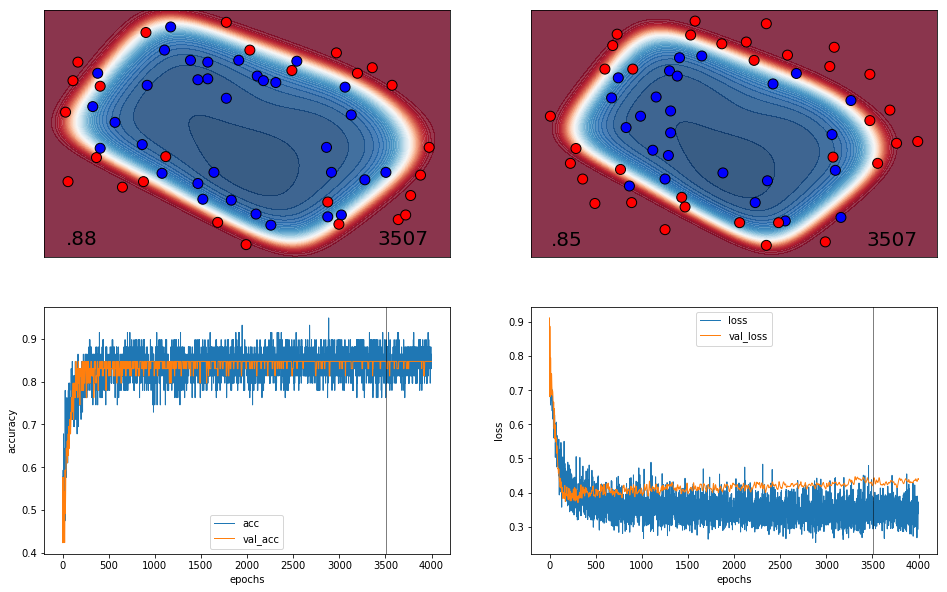

59/59 [==============================] - 0s 120us/step
3746 0.8644067927942438 0.8474576230776512


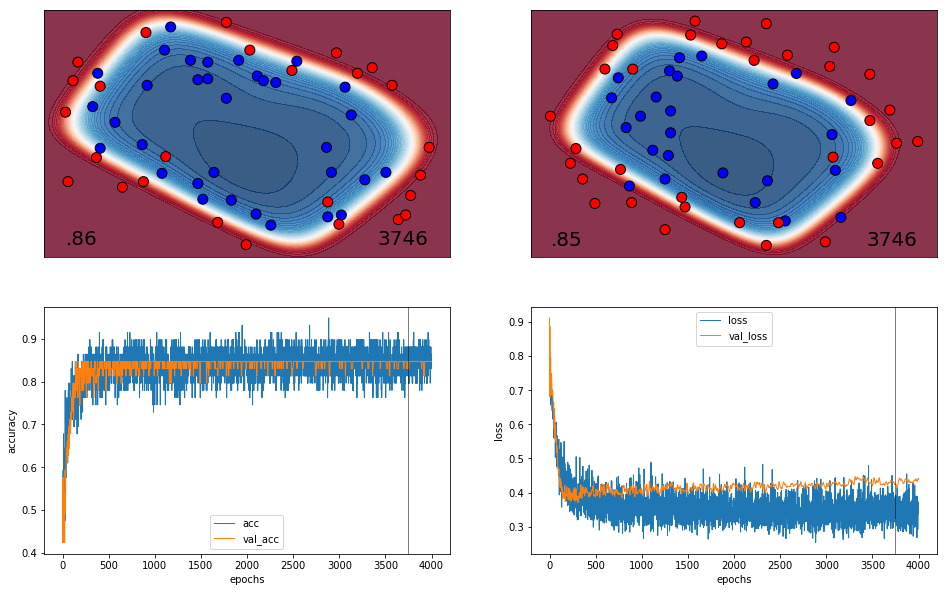

59/59 [==============================] - 0s 100us/step
4000 0.8644067927942438 0.8474576230776512


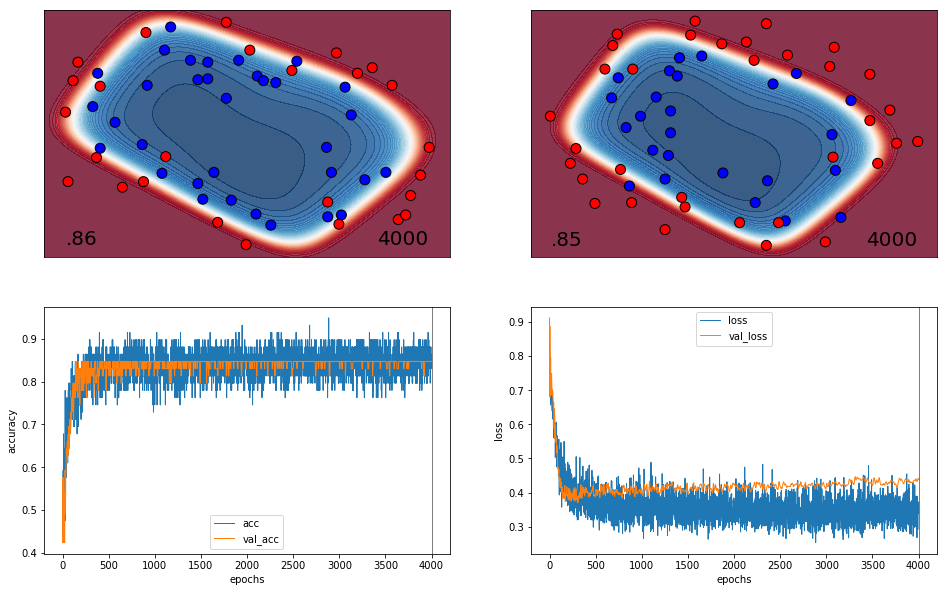

In [516]:
start = 0
log_space = gen_log_space(N, 100)
for index, i in enumerate(log_space[start:]):
    file = files[i]
    epoch = int(file.replace('./checkpoints/weights.','').split('.')[0].split('-')[0])
    # acc = float(file.replace('./checkpoints/weights.','').split('-')[1].replace('.hdf5',''))
    model.load_weights(file)
    acc = model.evaluate(X_train, y_train)[1]
    val_acc = model.evaluate(X_test, y_test)[1]
    print(epoch, acc, val_acc)
    
    fig, [[ax1, ax2], [ax3, ax4]] = plt.subplots(2, 2, figsize=(16,10))
    scatter = plot_boundaries_for_video(X_train, y_train, model.predict_proba, score = acc, epoch = epoch, h = 0.01, margin=0.1, ax=ax1)
    scatter = plot_boundaries_for_video(X_test, y_test, model.predict_proba, score = val_acc, epoch = epoch, h = 0.01, margin=0.1, ax=ax2)
    ax3.plot(plot_losses.acc[log_space[start]:N], lw=1, label="acc")
    ax3.plot(plot_losses.val_acc[log_space[start]:N], lw=1, label="val_acc")
    ax3.axvline(x=epoch, c='k', alpha=0.5, lw=1)
    ax3.set_xlabel('epochs')
    ax3.set_ylabel('accuracy')
    ax3.legend()
    #ax1.scatter(epoch_n, plot_losses.acc[epoch_n], s=50, c='k')
    #ax1.scatter(epoch_n, plot_losses.val_acc[epoch_n], s=50, c='k')
    ax4.plot(plot_losses.losses[log_space[start]:N], lw=1, label="loss")
    ax4.plot(plot_losses.val_losses[log_space[start]:N], lw=1, label="val_loss")
    ax4.axvline(x=epoch, c='k', alpha=0.5, lw=1)
    ax4.set_xlabel('epochs')
    ax4.set_ylabel('loss')
    ax4.legend()
    plt.savefig('./images/%04.d'%index)
    plt.show()

In [323]:
model.load_weights(files[0])
weights = model.get_weights()[0]
print(weights.shape)
print(weights.std())
print(abs(weights).max())

(2, 20)
0.5219499
0.9050425


In [465]:
stds_0 = []
maxs_0 = []
mins_0 = []
means_0 = []
stds_1 = []
maxs_1 = []
mins_1 = []
means_1 = []
for file in files:
    model.load_weights(file)
    weights = model.get_weights()
    weights_0 = weights[0]
    stds_0.append(weights_0.std())
    maxs_0.append(weights_0.max())
    mins_0.append(weights_0.min())
    means_0.append(weights_0.mean())
    weights_1 = weights[1]
    stds_1.append(weights_1.std())
    maxs_1.append(weights_1.max())
    mins_1.append(weights_1.min())
    means_1.append(weights_1.mean())
#print(stds_0)

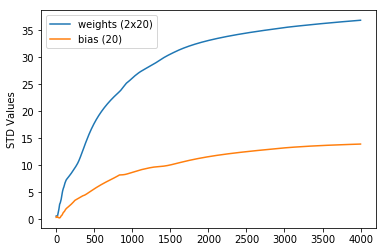

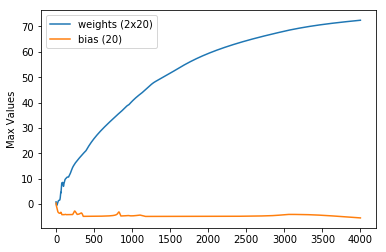

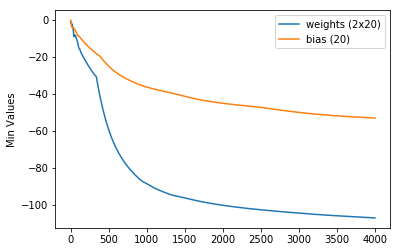

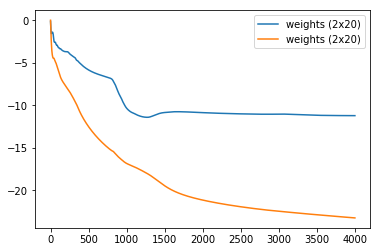

In [299]:
plt.plot(stds_0, label="weights (2x20)")
plt.plot(stds_1, label="bias (20)")
plt.ylabel('STD Values')
plt.legend()
plt.show()
plt.plot(maxs_0, label="weights (2x20)")
plt.plot(maxs_1, label="bias (20)")
plt.ylabel('Max Values')
plt.legend()
plt.show()
plt.plot(mins_0, label="weights (2x20)")
plt.plot(mins_1, label="bias (20)")
plt.ylabel('Min Values')
plt.legend()
plt.show()
plt.plot(means_0, label="weights (2x20)")
plt.plot(means_1, label="weights (2x20)")
plt.legend()
plt.show()

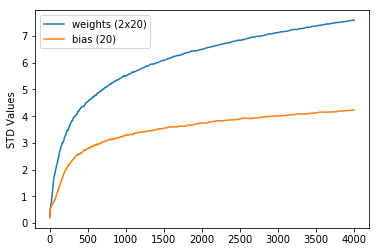

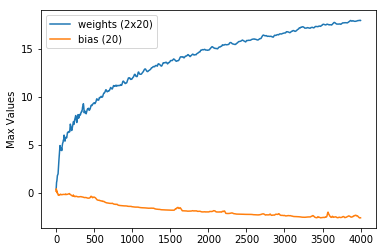

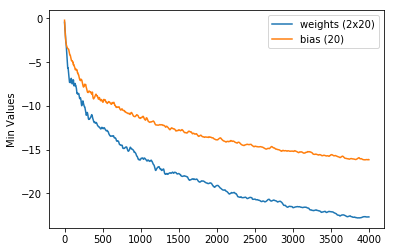

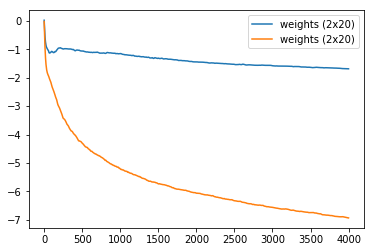

In [466]:
plt.plot(stds_0, label="weights (2x20)")
plt.plot(stds_1, label="bias (20)")
plt.ylabel('STD Values')
plt.legend()
plt.show()
plt.plot(maxs_0, label="weights (2x20)")
plt.plot(maxs_1, label="bias (20)")
plt.ylabel('Max Values')
plt.legend()
plt.show()
plt.plot(mins_0, label="weights (2x20)")
plt.plot(mins_1, label="bias (20)")
plt.ylabel('Min Values')
plt.legend()
plt.show()
plt.plot(means_0, label="weights (2x20)")
plt.plot(means_1, label="weights (2x20)")
plt.legend()
plt.show()